# Grad-ECLIP Visualization Script
-------------------------------
**This script loads a fine-tuned CLIP model and generates Grad-ECLIP and Grad-CAM heatmaps for a dermoscopic image given a set of textual attributes. It implements the visualization pipeline described in the MedGrad-ECLIP paper.**


In [ ]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 5.0 MB/s eta 0:00:00
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-fvr9vvm0
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-fvr9vvm0
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 67.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip3 install open_clip_torch
# !pip install open_clip_torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 47.5 MB/s eta 0:00:00


In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
from open_clip import create_model_from_pretrained
import cv2
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
clip_inres = clipmodel.visual.input_resolution
clip_ksize = clipmodel.visual.conv1.kernel_size

print("[clip resolution]:", clip_inres)
print("[clip kernel size]:", clip_ksize)

100%|███████████████████████████████████████| 335M/335M [00:04<00:00, 77.3MiB/s]


[clip resolution]: 224
[clip kernel size]: (16, 16)


In [ ]:
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model architecture
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
clip_inres = clipmodel.visual.input_resolution
clip_ksize = clipmodel.visual.conv1.kernel_size

# Load your fine-tuned model weights
# model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# clip_model.load_state_dict(torch.load(model_path, map_location=device))

parser = argparse.ArgumentParser()
parser.add_argument("--model_path", type=str, required=True) #The model from the training CLIP
args = parser.parse_args()

clipmodel.load_state_dict(torch.load(args.model_path, map_location=device))


# Set the model to evaluation mode
clipmodel.eval()


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

In [ ]:
_transform = Compose([
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])
def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map*255).astype(np.uint8), cv2.COLORMAP_JET) # cv2 to plt
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

In [ ]:
def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def clip_encode_dense(x,n):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64
    print("[vision_width and vision_heads]:", vision_width, vision_heads)

    # modified from CLIP
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    ## scale position embedding as the image w-h ratio
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    assert img_pos.size(0) == (pos_h * pos_w), f"the size of pos_embedding ({img_pos.size(0)}) does not match resolution shape pos_h ({pos_h}) * pos_w ({pos_w})"
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    print("[POS shape]:", img_pos.shape, (feah, feaw))
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)  # vision_heads=1
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, attns, atten_outs, (feah, feaw)

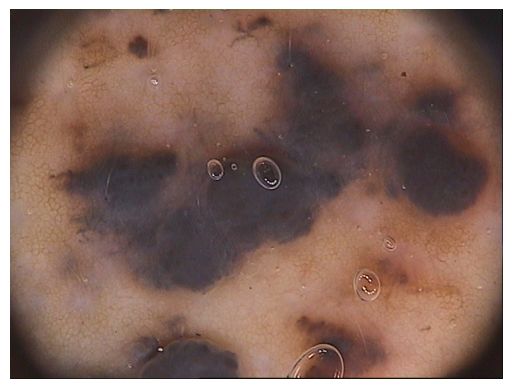

In [ ]:
import os
from urllib.request import urlopen
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

# # img_path = "/content/IMD088.bmp"
# img_path = "/content/AAAIMD240.bmp"
# img = Image.open(img_path).convert("RGB")
# texts = ["melanoma", "fully assymetric", "atypical pigmented network", "absent dots/globules", "present streaks", "present regression areas","present blue whitish veil", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# # texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# # texts = ["melanoma ", "absent pigment network", "irregular streaks", "blue areas regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# # texts = ["melanoma ", "atypical pigment network", "irregular streaks", "white areas regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "within regression vascular structures", "diffuse regular pigmentation"]
# # texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# # texts = ["clark nevus", "typical pigment network", "absent streaks", "white areas regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "missing vascular structures", "absent pigmentation"]
# # texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# # texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# # texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# # texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown/dark-brown color", "missing vascular_structures", "missing pigmentation"]
# # texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# # texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]
# Replace img_path and texts with your own image and attribute list
img_path = "/path/to/image.bmp"
texts = ["melanoma", "atypical pigment network", "present streaks", ...]
img = Image.open(img_path).convert("RGB")
plt.imshow(img)
plt.axis('off')
plt.show()

In [ ]:
# preprocess image and text
img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()
# extract text featrue
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
print("[text embedding]:", text_embedding.shape)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
print("[image embedding]:", ori_img_embedding.shape)

cosine = (ori_img_embedding @ text_embedding.T)
print("[cosine]:", cosine)

[text embedding]: torch.Size([11, 512])
[image embedding]: torch.Size([1, 512])
[cosine]: tensor([[0.2444, 0.1915, 0.1809, 0.2002, 0.1876, 0.1615, 0.1912, 0.2267, 0.2527,
         0.1876, 0.2015]], device='cuda:0', dtype=torch.float16,
       grad_fn=<MmBackward0>)


In [ ]:
img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
#
# x, vs, qs, ks, attns, atten_outs, (feah, feaw)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:,0], dim=-1)
print("[image embedding]:", img_embedding.shape)
cosine = (img_embedding @ text_embedding.T)[0]
print("cosine:", cosine)

# similarity between text prompt and patch features
p_final = F.normalize(outputs[:,1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1,0).reshape(-1, *map_size)
print("[position similarity (cosine p)]:", cosine_p.shape)

[vision_width and vision_heads]: 768 12
[POS shape]: torch.Size([1, 768, 14, 14]) (36, 48)
[image embedding]: torch.Size([1, 512])
cosine: tensor([0.2358, 0.2244, 0.1572, 0.2355, 0.1763, 0.2009, 0.2050, 0.2396, 0.2095,
        0.2251, 0.2334], device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
[position similarity (cosine p)]: torch.Size([11, 36, 48])


# Generate Grad-ECLIP map

In [ ]:
# generate ODAM map

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk

def grad_eclip(c, qs, ks, vs, attn_outputs, map_size):
    ## gradient on last attention output
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(
            c,
            attn_output,
            retain_graph=True)[0]

        grad_cls = grad[:1,0,:]
        v_patch = v[1:,0,:]
        cosine_qk = sim_qk(q, k).reshape(-1)
        tmp_maps.append((grad_cls * v_patch * cosine_qk[:,None]).sum(-1))

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0)
    return emap.reshape(*map_size)

def self_attn(attns, map_size):
    attn_patch = attns[-1][0,:1,1:].reshape(*map_size)
    print("[attn of cls token on lastv]:", attn_patch.shape)
    return attn_patch

def grad_cam(c, feat, map_size):
    ## GRAD-CAM: use the feature outputs of the final attention layer
    grad = torch.autograd.grad(
        c,
        feat,
        retain_graph=True)[0]
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * feat).sum(-1))
    grad_cam = grad_cam[1:].reshape(*map_size)
    return  grad_cam


['melanoma', 'fully assymetric', 'atypical pigmented network', 'absent dots/globules', 'present streaks', 'present regression areas', 'present blue whitish veil', 'blue-gray color', 'black color', 'missing vascular structures', 'missing pigmentation']


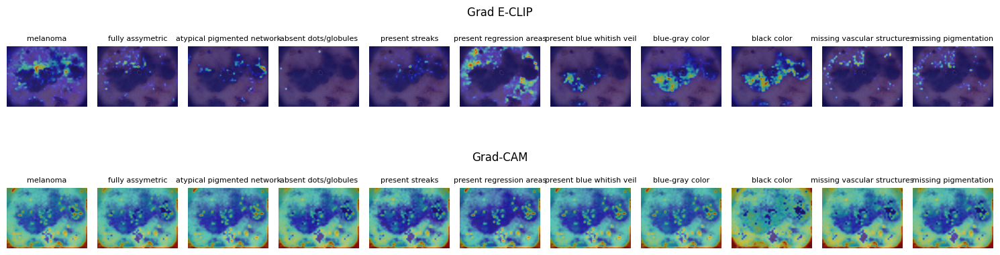

In [ ]:
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip(c, qs, ks, vs, atten_outs, map_size))
    grad_cams.append(grad_cam(c, last_feat, map_size))

print(texts)
h, w = img.size
resize = T.Resize((w,h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)
    ax[0].set_title(texts[i], fontsize=8)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)
    ax[1].set_title(texts[i], fontsize=8)
# Adding titles for each row
fig.text(0.5, 0.82, 'Grad E-CLIP', ha='center', va='top', fontsize=12)
fig.text(0.5, 0.46, 'Grad-CAM', ha='center', va='top', fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.94])  # Adjust the layout to make space for the row titles
plt.show()
# fig.tight_layout()

......

In [ ]:
def self_attn(attns, map_size):
    attn_patch = attns[-1][0,:1,1:].reshape(*map_size)
    print("[attn of cls token on lastv]:", attn_patch.shape)
    return attn_patch

def grad_cam(c, feat, map_size):
    ## GRAD-CAM: use the feature outputs of the final attention layer
    grad = torch.autograd.grad(
        c,
        feat,
        retain_graph=True)[0]
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * feat).sum(-1))
    grad_cam = grad_cam[1:].reshape(*map_size)
    return  grad_cam

original fine-tuned

100%|███████████████████████████████████████| 335M/335M [00:06<00:00, 54.8MiB/s]
<ipython-input-3-cea8c2f705bc>:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  clipmodel.l

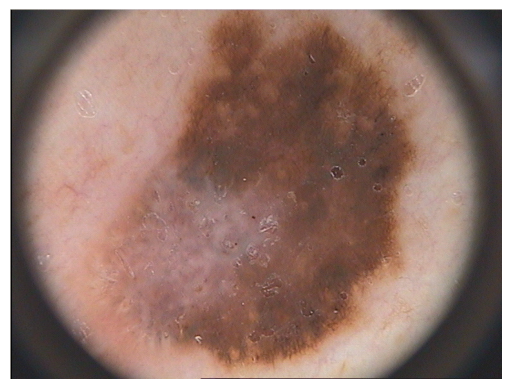

[text embedding]: torch.Size([13, 512])
[image embedding]: torch.Size([1, 512])
[cosine]: tensor([[0.2347, 0.1959, 0.1700, 0.1769, 0.2148, 0.2056, 0.1826, 0.2512, 0.1835,
         0.2166, 0.2188, 0.1815, 0.1976]], device='cuda:0',
       dtype=torch.float16, grad_fn=<MmBackward0>)
[vision_width and vision_heads]: 768 12
[POS shape]: torch.Size([1, 768, 14, 14]) (36, 48)
[image embedding]: torch.Size([1, 512])
cosine: tensor([0.2362, 0.1840, 0.1499, 0.2018, 0.1664, 0.2339, 0.2119, 0.2350, 0.1786,
        0.2197, 0.1830, 0.2201, 0.2263], device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
[position similarity (cosine p)]: torch.Size([13, 36, 48])
['melanoma', 'atypical pigmented', 'present streaks', 'regression areas', 'atypical dots/globules', 'absent blue-whitish veil', 'fully asymmetric', 'white color', 'dark-brown', 'blue-gray', 'black color', 'missing vascular structures', 'missing pigmentation']


<ipython-input-3-cea8c2f705bc>:46: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map*255).astype(np.uint8), cv2.COLORMAP_JET) # cv2 to plt


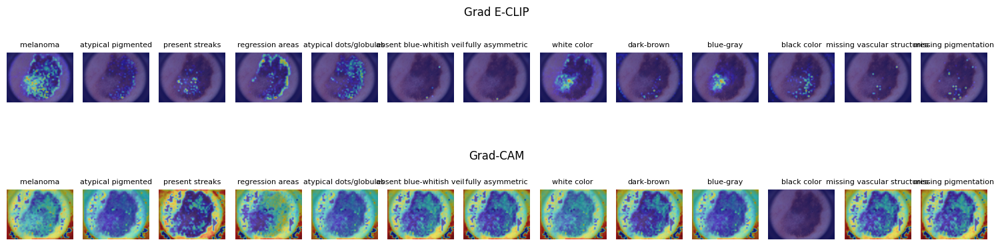

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model architecture
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
clip_inres = clipmodel.visual.input_resolution
clip_ksize = clipmodel.visual.conv1.kernel_size

# Load your fine-tuned model weights
# model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# clip_model.load_state_dict(torch.load(model_path, map_location=device))

clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# Set the model to evaluation mode
clipmodel.eval()

_transform = Compose([
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])
def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map*255).astype(np.uint8), cv2.COLORMAP_JET) # cv2 to plt
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret
def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def clip_encode_dense(x,n):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64
    print("[vision_width and vision_heads]:", vision_width, vision_heads)

    # modified from CLIP
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    ## scale position embedding as the image w-h ratio
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    assert img_pos.size(0) == (pos_h * pos_w), f"the size of pos_embedding ({img_pos.size(0)}) does not match resolution shape pos_h ({pos_h}) * pos_w ({pos_w})"
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    print("[POS shape]:", img_pos.shape, (feah, feaw))
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)  # vision_heads=1
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, attns, atten_outs, (feah, feaw)


# generate ODAM map

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk

def grad_eclip(c, qs, ks, vs, attn_outputs, map_size):
    ## gradient on last attention output
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(
            c,
            attn_output,
            retain_graph=True)[0]

        grad_cls = grad[:1,0,:]
        v_patch = v[1:,0,:]
        cosine_qk = sim_qk(q, k).reshape(-1)
        tmp_maps.append((grad_cls * v_patch * cosine_qk[:,None]).sum(-1))

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0)
    return emap.reshape(*map_size)

def self_attn(attns, map_size):
    attn_patch = attns[-1][0,:1,1:].reshape(*map_size)
    print("[attn of cls token on lastv]:", attn_patch.shape)
    return attn_patch

def grad_cam(c, feat, map_size):
    ## GRAD-CAM: use the feature outputs of the final attention layer
    grad = torch.autograd.grad(
        c,
        feat,
        retain_graph=True)[0]
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * feat).sum(-1))
    grad_cam = grad_cam[1:].reshape(*map_size)
    return  grad_cam

# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown", "dark-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["Melanoma", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Present Blue-Whitish Veil","Fully Symmetric", "Light-Brown color", "Dark-Brown color", "Blue-Gray color", "missing vascular structures","missing pigmentation"]

texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white color", "dark-brown", "blue-gray", "black color", "missing vascular structures", "missing pigmentation"]
plt.imshow(img)
plt.axis('off')
plt.show()

# preprocess image and text
img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()
# extract text featrue
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
print("[text embedding]:", text_embedding.shape)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
print("[image embedding]:", ori_img_embedding.shape)

cosine = (ori_img_embedding @ text_embedding.T)
print("[cosine]:", cosine)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
#
# x, vs, qs, ks, attns, atten_outs, (feah, feaw)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:,0], dim=-1)
print("[image embedding]:", img_embedding.shape)
cosine = (img_embedding @ text_embedding.T)[0]
print("cosine:", cosine)

# similarity between text prompt and patch features
p_final = F.normalize(outputs[:,1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1,0).reshape(-1, *map_size)
print("[position similarity (cosine p)]:", cosine_p.shape)

grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip(c, qs, ks, vs, atten_outs, map_size))
    grad_cams.append(grad_cam(c, last_feat, map_size))

print(texts)
h, w = img.size
resize = T.Resize((w,h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)
    ax[0].set_title(texts[i], fontsize=8)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)
    ax[1].set_title(texts[i], fontsize=8)
# Adding titles for each row
fig.text(0.5, 0.82, 'Grad E-CLIP', ha='center', va='top', fontsize=12)
fig.text(0.5, 0.46, 'Grad-CAM', ha='center', va='top', fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.94])  # Adjust the layout to make space for the row titles
plt.show()
# fig.tight_layout()


gaussian filtering post processing

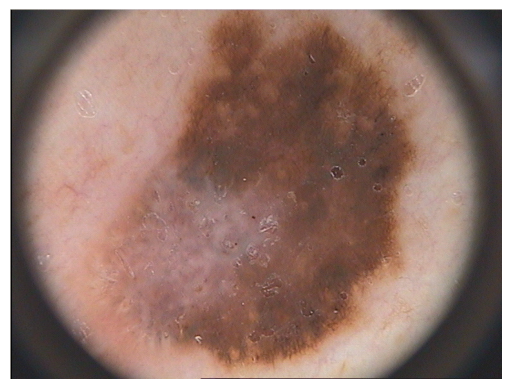

[text embedding]: torch.Size([13, 512])
[image embedding]: torch.Size([1, 512])
[cosine]: tensor([[0.2347, 0.1959, 0.1700, 0.1746, 0.2148, 0.2063, 0.1826, 0.2512, 0.1819,
         0.2183, 0.2188, 0.1815, 0.1976]], device='cuda:0',
       dtype=torch.float16, grad_fn=<MmBackward0>)
[vision_width and vision_heads]: 768 12
[POS shape]: torch.Size([1, 768, 14, 14]) (36, 48)
[image embedding]: torch.Size([1, 512])
cosine: tensor([0.2362, 0.1840, 0.1499, 0.2001, 0.1664, 0.2339, 0.2119, 0.2350, 0.1799,
        0.2200, 0.1830, 0.2201, 0.2263], device='cuda:0', dtype=torch.float16,
       grad_fn=<SelectBackward0>)
[position similarity (cosine p)]: torch.Size([13, 36, 48])
['melanoma', 'atypical pigmented', 'present streaks', 'present regression areas', 'atypical dots/globules', 'absent blue whitish veil', 'fully asymmetric', 'white color', 'dark-brown color', 'blue-gray color', 'black color', 'missing vascular structures', 'missing pigmentation']


<ipython-input-10-122faf9b3265>:63: RuntimeWarning: invalid value encountered in cast
  map = (map * 255).astype(np.uint8)


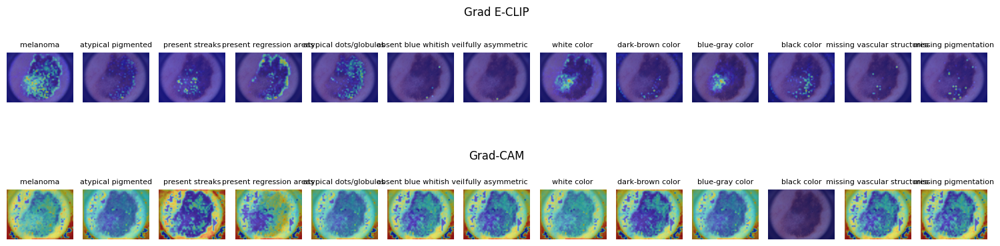

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# # model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# # clip_model.load_state_dict(torch.load(model_path, map_location=device))

# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])
def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize, apply_gaussian=True, apply_sharpening=True):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()

    # Ensure map is in the correct data type (float32) for OpenCV operations
    map = map.astype(np.float32)

    # Apply Gaussian filtering to smooth the attention map
    if apply_gaussian:
        map = cv2.GaussianBlur(map, (5, 5), 0)  # Gaussian filter with a 5x5 kernel

    # Apply sharpening filter
    if apply_sharpening:
        sharpening_kernel = np.array([[-1, -1, -1],
                                      [-1, 9, -1],
                                      [-1, -1, -1]])  # Sharpening kernel
        map = cv2.filter2D(map, -1, sharpening_kernel)

    # Normalize the map between 0 and 255
    map = (map - np.min(map)) / (np.max(map) - np.min(map))
    map = (map * 255).astype(np.uint8)

    # Convert attention map to a heatmap
    color = cv2.applyColorMap(map, cv2.COLORMAP_JET)  # Apply JET colormap to the map
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)

    # Blend the heatmap with the original image
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)

    return c_ret


def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def clip_encode_dense(x,n):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64
    print("[vision_width and vision_heads]:", vision_width, vision_heads)

    # modified from CLIP
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    ## scale position embedding as the image w-h ratio
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    assert img_pos.size(0) == (pos_h * pos_w), f"the size of pos_embedding ({img_pos.size(0)}) does not match resolution shape pos_h ({pos_h}) * pos_w ({pos_w})"
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    print("[POS shape]:", img_pos.shape, (feah, feaw))
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)  # vision_heads=1
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, attns, atten_outs, (feah, feaw)


# generate ODAM map

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk

def grad_eclip(c, qs, ks, vs, attn_outputs, map_size):
    ## gradient on last attention output
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(
            c,
            attn_output,
            retain_graph=True)[0]

        grad_cls = grad[:1,0,:]
        v_patch = v[1:,0,:]
        cosine_qk = sim_qk(q, k).reshape(-1)
        tmp_maps.append((grad_cls * v_patch * cosine_qk[:,None]).sum(-1))

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0)
    return emap.reshape(*map_size)

def self_attn(attns, map_size):
    attn_patch = attns[-1][0,:1,1:].reshape(*map_size)
    print("[attn of cls token on lastv]:", attn_patch.shape)
    return attn_patch

def grad_cam(c, feat, map_size):
    ## GRAD-CAM: use the feature outputs of the final attention layer
    grad = torch.autograd.grad(
        c,
        feat,
        retain_graph=True)[0]
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * feat).sum(-1))
    grad_cam = grad_cam[1:].reshape(*map_size)
    return  grad_cam

# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown/dark-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

# preprocess image and text
img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()
# extract text featrue
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
print("[text embedding]:", text_embedding.shape)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
print("[image embedding]:", ori_img_embedding.shape)

cosine = (ori_img_embedding @ text_embedding.T)
print("[cosine]:", cosine)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
#
# x, vs, qs, ks, attns, atten_outs, (feah, feaw)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:,0], dim=-1)
print("[image embedding]:", img_embedding.shape)
cosine = (img_embedding @ text_embedding.T)[0]
print("cosine:", cosine)

# similarity between text prompt and patch features
p_final = F.normalize(outputs[:,1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1,0).reshape(-1, *map_size)
print("[position similarity (cosine p)]:", cosine_p.shape)

grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip(c, qs, ks, vs, atten_outs, map_size))
    grad_cams.append(grad_cam(c, last_feat, map_size))

print(texts)
h, w = img.size
resize = T.Resize((w,h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    # Grad-ECLIP with local sensitivity enhancement
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize, apply_gaussian=True, apply_sharpening=True)
    ax[0].axis('off')
    ax[0].imshow(c_ret)
    ax[0].set_title(texts[i], fontsize=8)

    # Grad-CAM with local sensitivity enhancement
    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize, apply_gaussian=True, apply_sharpening=True)
    ax[1].axis('off')
    ax[1].imshow(c_ret)
    ax[1].set_title(texts[i], fontsize=8)

# Adding titles for each row
fig.text(0.5, 0.82, 'Grad E-CLIP', ha='center', va='top', fontsize=12)
fig.text(0.5, 0.46, 'Grad-CAM', ha='center', va='top', fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.94])  # Adjust the layout to make space for the row titles
plt.show()
# fig.tight_layout()


multiscale attention

sadia weighted aggregate gradient -dnd

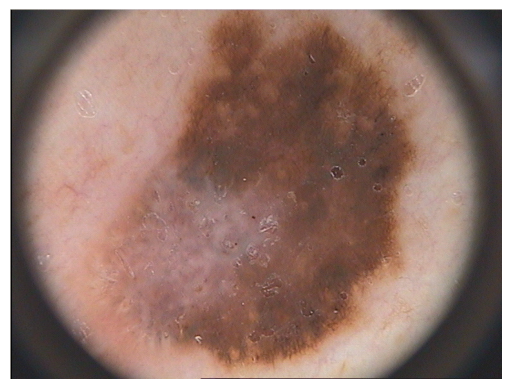

[vision_width and vision_heads]: 768 12
[POS shape]: torch.Size([1, 768, 14, 14]) (36, 48)
Cosine similarity values:
[[0.195  0.196  0.2112 0.2076 0.2018 0.2056 0.1958 0.1643 0.1855 0.1976]]


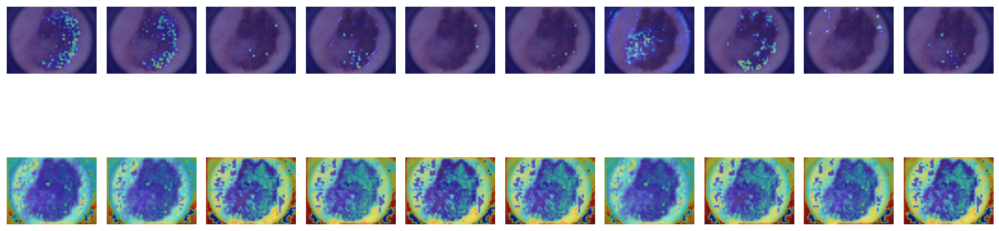

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# # model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# # clip_model.load_state_dict(torch.load(model_path, map_location=device))

# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def clip_encode_dense(x,n):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64
    print("[vision_width and vision_heads]:", vision_width, vision_heads)

    # modified from CLIP
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    ## scale position embedding as the image w-h ratio
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    assert img_pos.size(0) == (pos_h * pos_w), f"the size of pos_embedding ({img_pos.size(0)}) does not match resolution shape pos_h ({pos_h}) * pos_w ({pos_w})"
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    print("[POS shape]:", img_pos.shape, (feah, feaw))
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)  # vision_heads=1
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, attns, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk


import torch.nn.functional as F

def compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device="cuda"):
    """
    Compute cosine similarity between image features and corresponding text embeddings
    and use this to determine region-based feature importance weights.
    """
    # Normalize image patch features (ignore class token, which is at index 0)
    p_final = F.normalize(outputs[:, 1:], dim=-1)  # Shape: (batch, num_patches, feature_dim)

    # Compute cosine similarity between each patch feature and text embeddings
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

    # Reshape the similarity scores to match the feature map size
    cosine_sim = cosine_sim[0].reshape(*map_size)  # Shape: (height, width)

    # Normalize the cosine similarities to create weights (between 0 and 1)
    cosine_sim -= cosine_sim.min()  # Shift to 0
    cosine_sim /= cosine_sim.max()  # Scale to [0, 1]

    # Flatten the weight map and move to the specified device
    return cosine_sim.view(-1).to(device)

# Updated weighted gradient aggregation with cosine similarity weights
def grad_eclip_with_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, cosine_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key (move to device)
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Apply weighted gradient aggregation using cosine similarity weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, cosine_qk, map_size, cosine_weights, device)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)



# Weighted Gradient Aggregation Functions
def weighted_gradient_aggregation(grad_cls,v_patch, cosine_qk, map_size, region_weights=None, device="cuda"):
    cosine_qk = cosine_qk.reshape(-1).to(device)  # Move to device

    if region_weights is None:
        region_weights = torch.ones_like(cosine_qk).to(device)  # Move to device if needed
    else:
        region_weights = region_weights.to(device)  # Ensure region_weights are on the correct device

    region_weights = region_weights / region_weights.sum()

    # Perform weighted gradient aggregation
    weighted_grad = (grad_cls * v_patch * cosine_qk[:, None]) * region_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad
# def dot_product_weights(outputs, text_embeddings, map_size, device="cuda"):
#     """
#     Compute the dot product between image patch features and corresponding text embeddings.
#     """
#     p_final = outputs[:, 1:]  # Exclude the class token
#     dot_products = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

#     # Reshape the dot products to match the feature map size
#     dot_products = dot_products[0].reshape(*map_size)  # Shape: (height, width)

#     # Normalize the dot product values
#     dot_products -= dot_products.min()
#     dot_products /= dot_products.max()

#     return dot_products.view(-1).to(device)

# def grad_eclip_with_dot_product_weights(c, qs, ks, vs, attn_outputs, map_size, dot_weights, device="cuda"):
#     tmp_maps = []
#     for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
#         # Compute gradients (ensure they are computed on the right device)
#         grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

#         # Class token gradient and patch values (move to device)
#         grad_cls = grad[:1, 0, :].to(device)
#         v_patch = v[1:, 0, :].to(device)

#         # Compute the dot product as the weights
#         weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device=device)
#         tmp_maps.append(weighted_aggregate)

#     # Final aggregation with ReLU on the correct device
#     emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

#     return emap.reshape(*map_size)

# # Weighted Gradient Aggregation Functions
# def weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device="cuda"):
#     dot_weights = dot_weights.reshape(-1).to(device)  # Move to device
#     dot_weights = dot_weights / dot_weights.sum()  # Normalize weights

#     # Perform weighted gradient aggregation
#     weighted_grad = (grad_cls * v_patch * dot_weights[:, None])
#     aggregated_grad = weighted_grad.sum(-1)

#     return aggregated_grad
import scipy.ndimage as nd


# Visualization Setup
img_path = "/content/IMD002.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown/dark-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

p_final = F.normalize(outputs[:, 1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1, 0).reshape(-1, *map_size)

# Compute cosine similarity between the image embedding and the text embeddings
cosine_similarity = (ori_img_embedding @ text_embedding.T).cpu().detach().numpy()

# Print the cosine similarity values
print("Cosine similarity values:")
print(cosine_similarity)

grad_emaps = []
grad_cams = []
cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")
# p_final = outputs[:, 1:]
# dot_weights = dot_product_weights(outputs, text_embedding, map_size, device="cuda")

for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_cosine_weights(c, qs, ks, vs, atten_outs, map_size, cosine_weights, device="cuda"))
    # grad_emaps.append(grad_eclip_with_dot_product_weights(c, qs, ks, vs, atten_outs, map_size, dot_weights, device="cuda"))

    grad_cams.append(grad_cam(c, last_feat, map_size))

# Plot the results
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))

for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


<h1>New</h1>


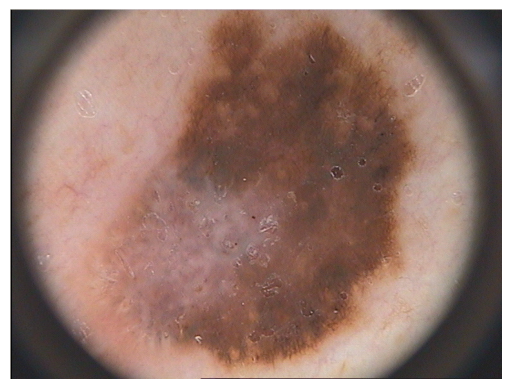

Cosine similarity values:
[[0.2347 0.1959 0.17   0.1769 0.2148 0.2056 0.1826 0.2512 0.1819 0.2183
  0.2188 0.1815 0.1976]]
tensor([0.7485, 0.8052, 0.8369,  ..., 0.6372, 0.6621, 0.6279], device='cuda:0',
       dtype=torch.float16, grad_fn=<ViewBackward0>)


<ipython-input-14-2ba9fd49c238>:47: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)


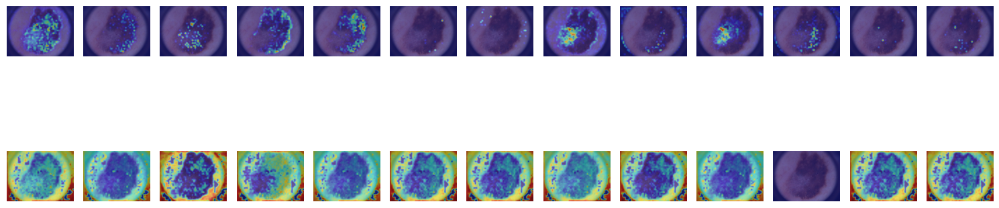

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# # model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# # clip_model.load_state_dict(torch.load(model_path, map_location=device))

# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights


def clip_encode_dense(x, n):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    x = x.half()  # Convert to half-precision
    x = clipmodel.visual.conv1(x)  # Pass through the first convolution layer
    feah, feaw = x.shape[-2:]  # Get the height and width of the feature map

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)

    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]

    # Original positional embedding size
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]

    # Reshape img_pos to match the original dimensions
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)

    # Increase the resolution of the positional embeddings to match the new feature map size
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)

    # Reshape the interpolated positional embeddings back to match the feature map
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)

    # Ensure that the positional embeddings and feature map have the same sequence length
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)

    # Check that the sequence lengths match
    assert x.shape[1] == pos_embedding.shape[1], f"Feature map and positional embeddings have different sequence lengths: {x.shape[1]} vs {pos_embedding.shape[1]}"

    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND

    # Process the input through the transformer layers
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []

    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)  # vision_heads=1
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj

    return x, x_in, vs, qs, ks, attns, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1, 0, :], dim=-1).to(q.device)
    k_patch = F.normalize(k[1:, 0, :], dim=-1).to(k.device)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk - cosine_qk_min) / (cosine_qk_max - cosine_qk_min)
    return cosine_qk

def grad_cam(c, feat, map_size):
    ## GRAD-CAM: use the feature outputs of the final attention layer
    grad = torch.autograd.grad(
        c,
        feat,
        retain_graph=True)[0]
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * feat).sum(-1))
    grad_cam = grad_cam[1:].reshape(*map_size)
    return  grad_cam

import torch.nn.functional as F

def compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device="cuda"):
    """
    Compute cosine similarity between image features and corresponding text embeddings
    and use this to determine region-based feature importance weights.
    """
    # Normalize image patch features (ignore class token, which is at index 0)
    p_final = F.normalize(outputs[:, 1:], dim=-1)  # Shape: (batch, num_patches, feature_dim)

    # Compute cosine similarity between each patch feature and text embeddings
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

    # Reshape the similarity scores to match the feature map size
    cosine_sim = cosine_sim[0].reshape(*map_size)  # Shape: (height, width)

    # Normalize the cosine similarities to create weights (between 0 and 1)
    cosine_sim -= cosine_sim.min()  # Shift to 0
    cosine_sim /= cosine_sim.max()  # Scale to [0, 1]

    # Flatten the weight map and move to the specified device
    return cosine_sim.view(-1).to(device)

# Updated weighted gradient aggregation with cosine similarity weights
def grad_eclip_with_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, cosine_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key (move to device)
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Apply weighted gradient aggregation using cosine similarity weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, cosine_qk, map_size, cosine_weights, device)
        # print(cosine_weights)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)


# Weighted Gradient Aggregation Functions
def weighted_gradient_aggregation(grad_cls, v_patch, cosine_qk, map_size, region_weights=None, device="cuda"):
    cosine_qk = cosine_qk.reshape(-1).to(device)  # Move to device

    if region_weights is None:
        region_weights = torch.ones_like(cosine_qk).to(device)  # Move to device if needed
    else:
        region_weights = region_weights.to(device)  # Ensure region_weights are on the correct device

    region_weights = region_weights / region_weights.sum()

    # Perform weighted gradient aggregation
    weighted_grad = (grad_cls * v_patch * cosine_qk[:, None]) * region_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad



# def dot_product_weights(outputs, text_embeddings, map_size, device="cuda"):
#     """
#     Compute the dot product between image patch features and corresponding text embeddings.
#     """
#     p_final = outputs[:, 1:]  # Exclude the class token
#     dot_products = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

#     # Reshape the dot products to match the feature map size
#     dot_products = dot_products[0].reshape(*map_size)  # Shape: (height, width)

#     # Normalize the dot product values
#     dot_products -= dot_products.min()
#     dot_products /= dot_products.max()

#     return dot_products.view(-1).to(device)

# def grad_eclip_with_dot_product_weights(c, qs, ks, vs, attn_outputs, map_size, dot_weights, device="cuda"):
#     tmp_maps = []
#     for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
#         # Compute gradients (ensure they are computed on the right device)
#         grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

#         # Class token gradient and patch values (move to device)
#         grad_cls = grad[:1, 0, :].to(device)
#         v_patch = v[1:, 0, :].to(device)

#         # Compute the dot product as the weights
#         weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device=device)
#         tmp_maps.append(weighted_aggregate)

#     # Final aggregation with ReLU on the correct device
#     emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

#     return emap.reshape(*map_size)

# # Weighted Gradient Aggregation Functions
# def weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device="cuda"):
#     dot_weights = dot_weights.reshape(-1).to(device)  # Move to device
#     dot_weights = dot_weights / dot_weights.sum()  # Normalize weights

#     # Perform weighted gradient aggregation
#     weighted_grad = (grad_cls * v_patch * dot_weights[:, None])
#     aggregated_grad = weighted_grad.sum(-1)

#     return aggregated_grad
import scipy.ndimage as nd


# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown/dark-brown color", "missing vascular_structures", "missing pigmentation"]
texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white color","dark-brown color", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

p_final = F.normalize(outputs[:, 1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1, 0).reshape(-1, *map_size)

# Compute cosine similarity between the image embedding and the text embeddings
cosine_similarity = (ori_img_embedding @ text_embedding.T).cpu().detach().numpy()

# Print the cosine similarity values
print("Cosine similarity values:")
print(cosine_similarity)

grad_emaps = []
grad_cams = []
cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")
print(cosine_weights)
# p_final = outputs[:, 1:]
# dot_weights = dot_product_weights(outputs, text_embedding, map_size, device="cuda")

for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_cosine_weights(c, qs, ks, vs, atten_outs, map_size, cosine_weights, device="cuda"))
    # grad_emaps.append(grad_eclip_with_dot_product_weights(c, qs, ks, vs, atten_outs, map_size, dot_weights, device="cuda"))


    grad_cams.append(grad_cam(c, last_feat, map_size))

# Plot the results
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))

for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


New cosine without w_i

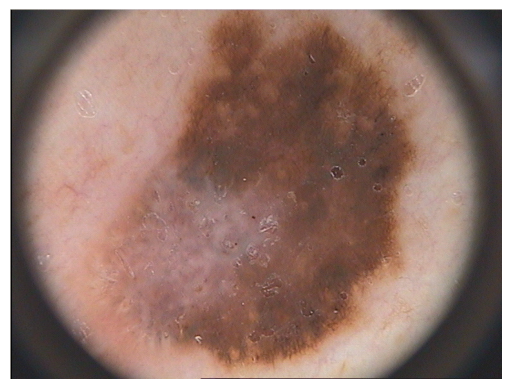

<ipython-input-8-a4076df9515e>:47: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)


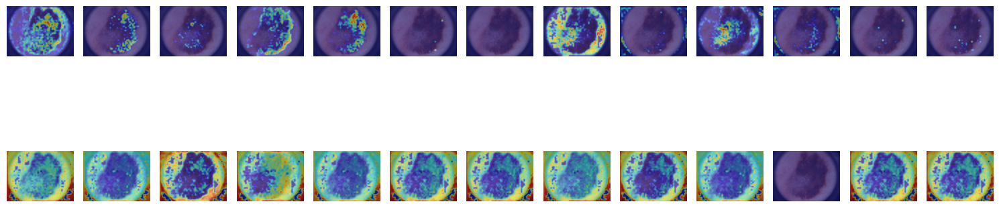

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=3):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)  # Adjust if fewer layers than specified
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)  # Average across the last layers
    return attn_map

# Your clip_encode_dense function stays the same

def clip_encode_dense(x, n=3):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    # Prepare the input for the CLIP model
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    # Scale positional embeddings
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    # Collect attention maps from the last n layers
    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    # Apply attention aggregation over the last 3 layers
    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk


import torch.nn.functional as F

def compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device="cuda"):
    """
    Compute cosine similarity between image features and corresponding text embeddings
    and use this to determine region-based feature importance weights.
    """
    # Normalize image patch features (ignore class token, which is at index 0)
    p_final = F.normalize(outputs[:, 1:], dim=-1)  # Shape: (batch, num_patches, feature_dim)

    # Compute cosine similarity between each patch feature and text embeddings
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

    # Reshape the similarity scores to match the feature map size
    cosine_sim = cosine_sim[0].reshape(*map_size)  # Shape: (height, width)

    # Normalize the cosine similarities to create weights (between 0 and 1)
    cosine_sim -= cosine_sim.min()  # Shift to 0
    cosine_sim /= cosine_sim.max()  # Scale to [0, 1]

    # Flatten the weight map and move to the specified device
    return cosine_sim.view(-1).to(device)

# Updated weighted gradient aggregation with cosine similarity weights
def grad_eclip_with_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, cosine_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key (move to device)
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Apply weighted gradient aggregation using cosine similarity weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, map_size, cosine_weights, device)
        # print(cosine_weights)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)


# Weighted Gradient Aggregation Functions
def weighted_gradient_aggregation(grad_cls, v_patch, map_size, region_weights=None, device="cuda"):

    if region_weights is None:
        region_weights = torch.ones_like(cosine_qk).to(device)  # Move to device if needed
    else:
        region_weights = region_weights.to(device)  # Ensure region_weights are on the correct device

    region_weights = region_weights / region_weights.sum()

    # Perform weighted gradient aggregation
    weighted_grad = (grad_cls * v_patch) * region_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad

# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")

texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
         "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Get text embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

# Get image embeddings
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

# Cosine similarity between image and text embeddings
cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute entropy weights and apply Grad-ECLIP using entropy-based relevance
cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")

# Generate Grad-ECLIP map using entropy-based relevance scores
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_cosine_weights(c, qs, ks, vs, atten_outs, map_size, cosine_weights, device="cuda"))
    grad_cams.append(grad_cam(c, last_feat, map_size))

# Visualization
h, w = img.size
resize = T.Resize((w,h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


<ipython-input-9-c062d62dc0a4>:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=devi

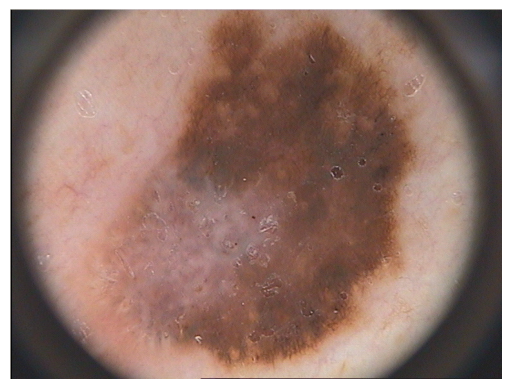

Cosine similarity values:
[[0.2347 0.196  0.17   0.1746 0.2147 0.2065 0.1826 0.2654 0.1814 0.1976]]


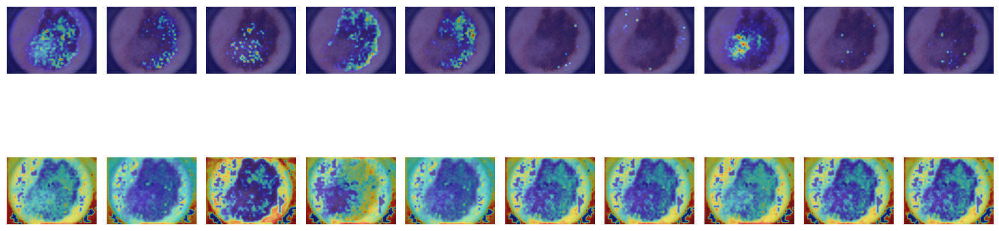

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model architecture
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
clip_inres = clipmodel.visual.input_resolution
clip_ksize = clipmodel.visual.conv1.kernel_size

# Load your fine-tuned model weights
# model_path = "/content/new_trainedmodel1.pth"  # Replace with your model path
# clip_model.load_state_dict(torch.load(model_path, map_location=device))

clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# Set the model to evaluation mode
clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=3):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)  # Adjust if fewer layers than specified
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)  # Average across the last layers
    return attn_map

# Your clip_encode_dense function stays the same

def clip_encode_dense(x, n=3):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    # Prepare the input for the CLIP model
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    # Scale positional embeddings
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    # Collect attention maps from the last n layers
    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    # Apply attention aggregation over the last 3 layers
    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1,0,:], dim=-1)
    k_patch = F.normalize(k[1:,0,:], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk-cosine_qk_min) / (cosine_qk_max-cosine_qk_min)
    return cosine_qk


import torch.nn.functional as F

def compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device="cuda"):
    """
    Compute cosine similarity between image features and corresponding text embeddings
    and use this to determine region-based feature importance weights.
    """
    # Normalize image patch features (ignore class token, which is at index 0)
    p_final = F.normalize(outputs[:, 1:], dim=-1)  # Shape: (batch, num_patches, feature_dim)

    # Compute cosine similarity between each patch feature and text embeddings
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

    # Reshape the similarity scores to match the feature map size
    cosine_sim = cosine_sim[0].reshape(*map_size)  # Shape: (height, width)

    # Normalize the cosine similarities to create weights (between 0 and 1)
    cosine_sim -= cosine_sim.min()  # Shift to 0
    cosine_sim /= cosine_sim.max()  # Scale to [0, 1]

    # Flatten the weight map and move to the specified device
    return cosine_sim.view(-1).to(device)

# Updated weighted gradient aggregation with cosine similarity weights
def grad_eclip_with_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, cosine_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Apply weighted gradient aggregation using cosine similarity weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, cosine_qk, map_size, cosine_weights, device)
        tmp_maps.append(weighted_aggregate)

    # Aggregate maps with ReLU
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)


# Weighted Gradient Aggregation Functions
def weighted_gradient_aggregation(grad_cls, v_patch, cosine_qk, map_size, region_weights=None, device="cuda"):
    cosine_qk = cosine_qk.reshape(-1).to(device)  # Move to device

    if region_weights is None:
        region_weights = torch.ones_like(cosine_qk).to(device)  # Move to device if needed
    else:
        region_weights = region_weights.to(device)  # Ensure region_weights are on the correct device

    region_weights = region_weights / region_weights.sum()

    # Perform weighted gradient aggregation
    weighted_grad = (grad_cls * v_patch * cosine_qk[:, None]) * region_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad
# def dot_product_weights(outputs, text_embeddings, map_size, device="cuda"):
#     """
#     Compute the dot product between image patch features and corresponding text embeddings.
#     """
#     p_final = outputs[:, 1:]  # Exclude the class token
#     dot_products = (p_final @ text_embeddings.T).mean(dim=-1)  # Shape: (batch, num_patches)

#     # Reshape the dot products to match the feature map size
#     dot_products = dot_products[0].reshape(*map_size)  # Shape: (height, width)

#     # Normalize the dot product values
#     dot_products -= dot_products.min()
#     dot_products /= dot_products.max()

#     return dot_products.view(-1).to(device)

# def grad_eclip_with_dot_product_weights(c, qs, ks, vs, attn_outputs, map_size, dot_weights, device="cuda"):
#     tmp_maps = []
#     for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
#         # Compute gradients (ensure they are computed on the right device)
#         grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

#         # Class token gradient and patch values (move to device)
#         grad_cls = grad[:1, 0, :].to(device)
#         v_patch = v[1:, 0, :].to(device)

#         # Compute the dot product as the weights
#         weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device=device)
#         tmp_maps.append(weighted_aggregate)

#     # Final aggregation with ReLU on the correct device
#     emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

#     return emap.reshape(*map_size)

# # Weighted Gradient Aggregation Functions
# def weighted_gradient_aggregation(grad_cls, v_patch, dot_weights, map_size, device="cuda"):
#     dot_weights = dot_weights.reshape(-1).to(device)  # Move to device
#     dot_weights = dot_weights / dot_weights.sum()  # Normalize weights

#     # Perform weighted gradient aggregation
#     weighted_grad = (grad_cls * v_patch * dot_weights[:, None])
#     aggregated_grad = weighted_grad.sum(-1)

#     return aggregated_grad
import scipy.ndimage as nd


# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma ", "atypical pigment network", "irregular streaks", "combinations regression structures", "irregular dots and globules", "present blue whitish veil", "missing asymmetry", "missing color", "dotted vascular structures", "diffuse regular pigmentation"]
# texts = ["seborrheic keratosis ", "absent pigment network", "absent streaks", "absent regression structures", "regular dots and globules", "absent blue whitish veil", "missing asymmetry", "missing color", "hairpin vascular structures", "diffuse regular pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "regression areas", "typical dots/globules", "absent blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "present blue-whitish veil","fully asymmetric", "dark brown color" , "missing vascular structures", "missing pigmentation"]
texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas", "atypical dots/globules", "absent blue whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes", "light-brown/dark-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "regression areas", "atypical dots/globules", "absent blue-whitish veil", "fully asymmetric", "white/dark-brown/blue-gray/black color", "missing vascular structures", "missing pigmentation"]
# texts = ["common nevus", "typical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "fully symmetric", "light-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

p_final = F.normalize(outputs[:, 1:], dim=-1)
cosine_p = (p_final @ text_embedding.T)[0].transpose(1, 0).reshape(-1, *map_size)

# Compute cosine similarity between the image embedding and the text embeddings
cosine_similarity = (ori_img_embedding @ text_embedding.T).cpu().detach().numpy()

# Print the cosine similarity values
print("Cosine similarity values:")
print(cosine_similarity)

grad_emaps = []
grad_cams = []
cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")
# p_final = outputs[:, 1:]
# dot_weights = dot_product_weights(outputs, text_embedding, map_size, device="cuda")

for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_cosine_weights(c, qs, ks, vs, atten_outs, map_size, cosine_weights, device="cuda"))
    # grad_emaps.append(grad_eclip_with_dot_product_weights(c, qs, ks, vs, atten_outs, map_size, dot_weights, device="cuda"))

    grad_cams.append(grad_cam(c, last_feat, map_size))

# Plot the results
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))

for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


MedGradE-CLIP:entropy based without wi

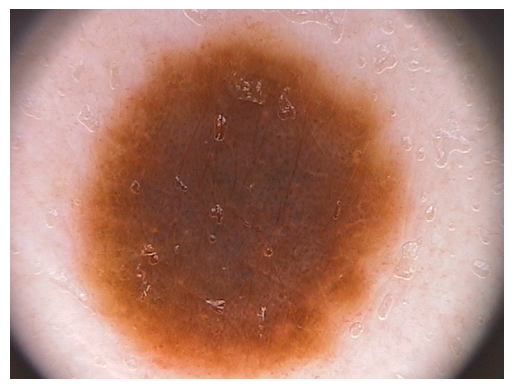

OutOfMemoryError: CUDA out of memory. Tried to allocate 12.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 8.12 MiB is free. Process 9029 has 14.73 GiB memory in use. Of the allocated memory 13.37 GiB is allocated by PyTorch, and 1.23 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=1):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)  # Adjust if fewer layers than specified
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)  # Average across the last layers
    return attn_map

# Your clip_encode_dense function stays the same

def clip_encode_dense(x, n=1):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    # Prepare the input for the CLIP model
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    # Scale positional embeddings
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    # Collect attention maps from the last n layers
    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    # Apply attention aggregation over the last 3 layers
    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

# Function to compute entropy weights
def compute_entropy_weights(img, map_size):
    gray_img = rgb2gray(np.asarray(img))
    entropy_map = entropy(gray_img, disk(5))  # Adjust disk size as needed
    print("Initial entropy map",entropy_map)
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())  # Normalize


    # Resize entropy map to match the number of patches (map_size)
    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)

    # Flatten the resized entropy map
    return torch.tensor(entropy_resized, device=device).view(-1)

# Updated weighted gradient aggregation using entropy weights
def grad_eclip_with_entropy_weights(c, qs, ks, vs, attn_outputs, map_size, entropy_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Apply weighted gradient aggregation using entropy-based weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, device)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)

# Weighted Gradient Aggregation Function
def weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, device="cuda"):
    entropy_weights = entropy_weights.to(device)  # Ensure entropy weights are on the correct device

    # Normalize entropy weights
    entropy_weights = entropy_weights / entropy_weights.sum()

    # Perform weighted gradient aggregation

    weighted_grad = (grad_cls * v_patch) * entropy_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad

# Visualization Setup
img_path = "/content/AAAIMD017.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["melanoma", "fully assymetric", "atypical pigmented network", "absent dots/globules", "present streaks", "present regression areas","present blue whitish veil", "blue-gray color", "black color", "missing vascular structures", "missing pigmentation"]
# # #          "missing pigmentation"]
texts = ["common nevus", "fully symmetric", "typical pigmented", "typical dots/globules",
         "absent streaks", "absent regression areas", "absent blue whitish veil",
         "light brown color", "Dark-Brown color", "missing vascular structures",
         "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes",
#          "light-brown", "dark-brown color", "missing vascular_structures", "missing pigmentation"]
# texts = ["Melanoma", "Atypical Pigmented", "Present Streaks", "Present Regression Areas",
#          "Atypical dots/globules", "Absent blue whitish veil", "Fully Asymmetric",
#          "White color", "Dark-Brown color", "Blue-Gray color", "Black Color", "missing vascular structures",
#          "missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Typical Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "Dark-Brown Color", "Black color", "missing vascular structures","missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Typical Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "Dark-Brown Color", "Light-Brown color", "missing vascular structures","missing pigmentation"]
# texts = ["Atypical Nevus", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Present Blue-Whitish Veil",
#          "Fully Symmetric", "Dark-Brown color", "Black color", "missing vascular structures","missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Typical Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "Light-Brown color", "Dark-Brown color", "missing vascular structures","missing pigmentation"]
# texts = ["Atypical Nevus", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Typical Dots/Globules", "Present Blue-Whitish Veil",
#          "Fully Symmetric", "White color", "Dark-Brown color", "Blue-Gray color", "missing vascular structures","missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "White color", "Blue-Gray color", "missing vascular structures","missing pigmentation"]
# texts = ["Melanoma", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Present Blue-Whitish Veil",
#          "Symmetric in 1 axes", "Blue-Gray color","Black color", "missing vascular structures","missing pigmentation"]
# texts = ["Melanoma", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Present Blue-Whitish Veil",
#          "Fully Symmetric", "Light-Brown color", "Dark-Brown color", "Blue-Gray color", "missing vascular structures","missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "Light-Brown color", "Dark-Brown color", "missing vascular structures","missing pigmentation"]
# texts = ["Common Nevus", "Typical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Absent Blue-Whitish Veil",
#          "Fully Symmetric", "Dark-Brown color", "missing vascular structures","missing pigmentation"]
# texts = ["atypical nevus", "Atypical Pigmented", "Absent Streaks", "Absent Regression Areas", "Absent Dots/Globules", "Present Blue-Whitish Veil",
#          "Fully Symmetric", "Light-Brown color", "Dark-Brown color", "Black color", "missing vascular structures","missing pigmentation"]
plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Get text embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

# Get image embeddings
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

# Cosine similarity between image and text embeddings
cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute entropy weights and apply Grad-ECLIP using entropy-based relevance
entropy_weights = compute_entropy_weights(img, map_size)

# Generate Grad-ECLIP map using entropy-based relevance scores
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_entropy_weights(c, qs, ks, vs, atten_outs, map_size, entropy_weights, device="cuda"))
    grad_cams.append(grad_cam(c, last_feat, map_size))

print(texts)
h, w = img.size
resize = T.Resize((w,h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)
    ax[0].set_title(texts[i], fontsize=8)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)
    ax[1].set_title(texts[i], fontsize=8)
# Adding titles for each row
fig.text(0.5, 0.82, 'Med Grad E-CLIP', ha='center', va='top', fontsize=12)
fig.text(0.5, 0.46, 'Grad-CAM', ha='center', va='top', fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.94])  # Adjust the layout to make space for the row titles
plt.show()


entropy on attention maps

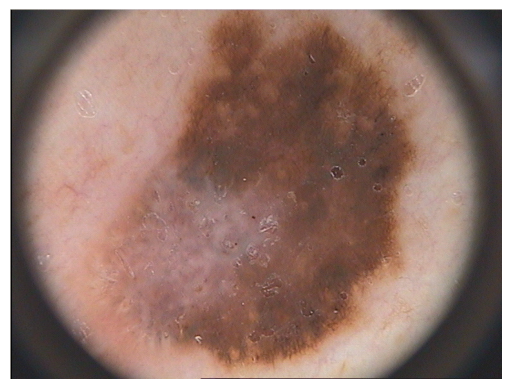

['Melanoma', 'Atypical Pigmented', 'Present Streaks', 'Present Regression Areas', 'Atypical dots/globules', 'Absent blue whitish veil', 'Fully Asymmetric', 'White color', 'Dark-Brown color', 'Blue-Gray color', 'Black Color', 'missing vascular structures', 'missing pigmentation']


<ipython-input-12-b91aefb5fec1>:47: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)


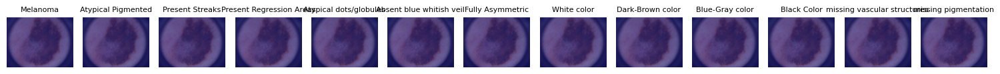

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=3):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)  # Adjust if fewer layers than specified
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)  # Average across the last layers
    return attn_map

def aggregate_attention_maps(attns):
    # attns: List of attention maps from different layers
    # Each attention map shape: [batch_size, num_heads, seq_len, seq_len]
    attn_maps = torch.stack(attns)  # Shape: [n_layers, batch_size, num_heads, seq_len, seq_len]
    # Average over layers and heads
    attn_map = attn_maps.mean(dim=0).mean(dim=1)  # Shape: [batch_size, seq_len, seq_len]
    return attn_map


# Your clip_encode_dense function stays the same

def clip_encode_dense(x, n=1):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    # Prepare the input for the CLIP model
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    # Scale positional embeddings
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    # Collect attention maps from the last n layers
    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    # Apply attention aggregation over the last 3 layers
    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

# def compute_attention_entropy(attn_map):
#     # attn_map shape: [batch_size, seq_len, seq_len]
#     cls_attn = attn_map[:, 0, 1:]  # Shape: [batch_size, seq_len - 1]
#     attn_probs = cls_attn / cls_attn.sum(dim=-1, keepdim=True)  # Shape: [batch_size, seq_len - 1]
#     epsilon = 1e-8  # Small constant to prevent log(0)
#     entropy = - (attn_probs + epsilon) * torch.log(attn_probs + epsilon)  # Shape: [batch_size, seq_len - 1]
#     # Normalize entropy per batch
#     entropy_min = entropy.min(dim=-1, keepdim=True)[0]
#     entropy_max = entropy.max(dim=-1, keepdim=True)[0]
#     entropy_normalized = (entropy - entropy_min) / (entropy_max - entropy_min + epsilon)  # Shape: [batch_size, seq_len - 1]
#     return entropy_normalized  # Shape: [batch_size, seq_len -1]
def compute_attention_certainty(attn_map):
    # Compute entropy as before
    cls_attn = attn_map[:, 0, 1:]  # Shape: [batch_size, seq_len - 1]
    attn_probs = cls_attn / cls_attn.sum(dim=-1, keepdim=True)
    epsilon = 1e-8
    entropy = - (attn_probs + epsilon) * torch.log(attn_probs + epsilon)
    # Sum over attention probabilities per patch
    entropy = entropy.sum(dim=-1)  # Shape: [batch_size, seq_len - 1]
    # Normalize entropy map
    entropy_min = entropy.min()
    entropy_max = entropy.max()
    entropy_normalized = (entropy - entropy_min) / (entropy_max - entropy_min + epsilon)
    # Invert entropy to get certainty
    certainty = 1 - entropy_normalized
    return certainty  # Shape: [batch_size, seq_len - 1]

def resize_entropy_map(entropy_map, map_size):
    # entropy_map shape: [seq_len - 1]
    entropy_map = entropy_map.view(map_size)  # Reshape to [height, width]
    return entropy_map


def grad_eclip_with_attention_entropy(c, qs, ks, vs, attn_outputs, map_size, entropy_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)
        # Apply weighted gradient aggregation using attention entropy weights
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, device)
        tmp_maps.append(weighted_aggregate)
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)
    return emap.reshape(*map_size)

# # Weighted Gradient Aggregation Function
# def weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, device="cuda"):
#     entropy_weights = entropy_weights.to(device)  # Ensure entropy weights are on the correct device

#     # Normalize entropy weights
#     entropy_weights = entropy_weights / entropy_weights.sum()

#     # Perform weighted gradient aggregation

#     weighted_grad = (grad_cls * v_patch) * entropy_weights[:, None]
#     aggregated_grad = weighted_grad.sum(-1)

#     return aggregated_grad

def weighted_gradient_aggregation(grad_cls, v_patch, certainty_weights, device="cuda"):
    certainty_weights = certainty_weights.to(device)
    # Normalize certainty weights
    certainty_weights = certainty_weights / certainty_weights.sum()
    # Perform weighted gradient aggregation
    weighted_grad = (grad_cls * v_patch) * certainty_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)
    return aggregated_grad

# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
texts = ["Melanoma", "Atypical Pigmented", "Present Streaks", "Present Regression Areas",
         "Atypical dots/globules", "Absent blue whitish veil", "Fully Asymmetric",
         "White color", "Dark-Brown color", "Blue-Gray color", "Black Color", "missing vascular structures",
         "missing pigmentation"]
plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Get text embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

# Get image embeddings
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

# Cosine similarity between image and text embeddings
cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, aggregated_attn_map, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Use the aggregated attention map obtained from clip_encode_dense
entropy_map = compute_attention_entropy(aggregated_attn_map)  # Shape: [1, seq_len - 1]
entropy_weights = resize_entropy_map(entropy_map[0], map_size).to(device).view(-1)  # Shape: [feah * feaw]

# Use the new entropy_weights in grad_eclip_with_attention_entropy
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_attention_entropy(c, qs, ks, vs, atten_outs, map_size, entropy_weights, device=device))
    # grad_cams.append(grad_cam(c, last_feat, map_size))

print(texts)
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=1, figsize=(15, 3))
for i, ax in enumerate(axs):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax.axis('off')
    ax.imshow(c_ret)
    ax.set_title(texts[i], fontsize=8)

fig.tight_layout()
plt.show()


entropy based with wi

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the CLIP model architecture
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
clip_inres = clipmodel.visual.input_resolution
clip_ksize = clipmodel.visual.conv1.kernel_size

# Load your fine-tuned model weights
clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# Set the model to evaluation mode
clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret
def clip_encode_dense(x, n=1):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    # Prepare the input for the CLIP model
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    # Scale positional embeddings
    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    # Collect attention maps from the last n layers
    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    # Apply attention aggregation over the last 3 layers
    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1, 0, :], dim=-1)
    k_patch = F.normalize(k[1:, 0, :], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk - cosine_qk_min) / (cosine_qk_max - cosine_qk_min)
    return cosine_qk

# Function to compute entropy weights
def compute_entropy_weights(img, map_size):
    gray_img = rgb2gray(np.asarray(img))
    entropy_map = entropy(gray_img, disk(6))  # Adjust disk size as needed
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())  # Normalize

    # Resize entropy map to match the number of patches (map_size)
    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)

    # Flatten the resized entropy map
    return torch.tensor(entropy_resized, device=device).view(-1)

# Updated weighted gradient aggregation using entropy weights and cosine_qk
def grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, entropy_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Apply weighted gradient aggregation using entropy-based weights and cosine_qk
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, device)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)

# Weighted Gradient Aggregation Function
def weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, device="cuda"):
    entropy_weights = entropy_weights.to(device)  # Ensure entropy weights are on the correct device

    # Normalize entropy weights
    # entropy_weights = entropy_weights / entropy_weights.sum()

    # Perform weighted gradient aggregation using entropy weights and cosine_qk
    weighted_grad = (grad_cls * v_patch * cosine_qk[:, None]) * entropy_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad

# Visualization Setup
img_path = "/content/IMD002.bmp"
img = Image.open(img_path).convert("RGB")

# texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
#          "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
#          "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
#          "missing pigmentation"]
texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules", "absent blue-whitish veil", "symmetric in 1 axes",
         "light-brown", "dark-brown color", "missing vascular_structures", "missing pigmentation"]
plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Get text embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

# Get image embeddings
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

# Cosine similarity between image and text embeddings
cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute entropy weights and apply Grad-ECLIP using entropy-based relevance
entropy_weights = compute_entropy_weights(img, map_size)

# Generate Grad-ECLIP map using entropy-based relevance scores and cosine_qk
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, atten_outs, map_size, entropy_weights, device="cuda"))
    grad_cams.append(grad_cam(c, last_feat, map_size))

# Visualization
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


<ipython-input-16-c52066414f7f>:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=dev

FileNotFoundError: [Errno 2] No such file or directory: '/content/IMD002.bmp'

entropy+w_i with threshold

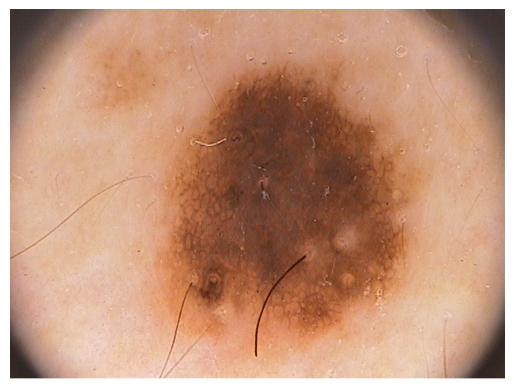

OutOfMemoryError: CUDA out of memory. Tried to allocate 20.00 MiB. GPU 0 has a total capacity of 14.75 GiB of which 3.06 MiB is free. Process 3629 has 14.74 GiB memory in use. Of the allocated memory 13.64 GiB is allocated by PyTorch, and 986.41 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def clip_encode_dense(x, n=1):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

def sim_qk(q, k):
    q_cls = F.normalize(q[:1, 0, :], dim=-1)
    k_patch = F.normalize(k[1:, 0, :], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk - cosine_qk_min) / (cosine_qk_max - cosine_qk_min)
    return cosine_qk

def compute_entropy_weights(img, map_size):
    gray_img = rgb2gray(np.asarray(img))
    entropy_map = entropy(gray_img, disk(6))
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())
    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)
    return torch.tensor(entropy_resized, device=device).view(-1)

def grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, entropy_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, device)
        tmp_maps.append(weighted_aggregate)
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)
    return emap.reshape(*map_size)

# Updated Weighted Gradient Aggregation Function with 70% Entropy and 30% Cosine Weighting
def weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, device="cuda"):
    entropy_weights = entropy_weights.to(device)
    cosine_qk = cosine_qk.to(device)
    combined_weights = 0.6 * entropy_weights + 0.4 * cosine_qk
    weighted_grad = (grad_cls * v_patch * combined_weights[:, None])
    aggregated_grad = weighted_grad.sum(-1)
    return aggregated_grad

img_path = "/content/IMD002.bmp"
img = Image.open(img_path).convert("RGB")

texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules",
         "absent blue-whitish veil", "symmetric in 1 axes", "light-brown", "dark-brown color",
         "missing vascular_structures", "missing pigmentation"]
# texts = ["dog", "car", "traffic lights", "a dog in a car waiting for traffic lights"]
# texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
#          "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
#          "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
#          "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

cosine = (ori_img_embedding @ text_embedding.T)
img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

entropy_weights = compute_entropy_weights(img, map_size)
grad_emaps = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, atten_outs, map_size, entropy_weights, device="cuda"))

h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=1, figsize=(15, 6))
for i, ax in enumerate(axs):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax.axis('off')
    ax.imshow(c_ret)

fig.tight_layout()
plt.show()


adaptive grad


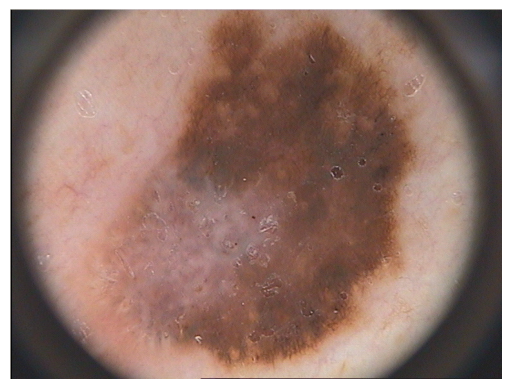

[vision_width and vision_heads]: 768 12


TypeError: 'int' object is not iterable

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray
from skimage import img_as_ubyte

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def sim_qk(q, k):
    q_cls = F.normalize(q[:1, 0, :], dim=-1)
    k_patch = F.normalize(k[1:, 0, :], dim=-1)

    cosine_qk = (q_cls * k_patch).sum(-1)
    cosine_qk_max = cosine_qk.max(dim=-1, keepdim=True)[0]
    cosine_qk_min = cosine_qk.min(dim=-1, keepdim=True)[0]
    cosine_qk = (cosine_qk - cosine_qk_min) / (cosine_qk_max - cosine_qk_min)
    return cosine_qk

# Function to compute entropy weights
def compute_entropy_weights(img, map_size):
    gray_img = rgb2gray(np.asarray(img))
    gray_img = img_as_ubyte(gray_img)  # Convert to uint8 to avoid precision warning
    entropy_map = entropy(gray_img, disk(6))  # Adjust disk size as needed
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())  # Normalize

    # Resize entropy map to match the number of patches (map_size)
    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)

    # Flatten the resized entropy map
    return torch.tensor(entropy_resized, device=device).view(-1)

# Updated weighted gradient aggregation using entropy weights and cosine_qk
def grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, attn_outputs, map_size, entropy_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        # Compute gradients (ensure they are computed on the right device)
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)

        # Class token gradient and patch values (move to device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)

        # Compute cosine similarity between query and key
        cosine_qk = sim_qk(q, k).reshape(-1).to(device)

        # Compute sensitivity map based on the gradient magnitude
        sensitivity_map = compute_sensitivity_map(grad_cls)

        # Apply weighted gradient aggregation using entropy-based weights, cosine_qk, and sensitivity map
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, sensitivity_map, device)
        tmp_maps.append(weighted_aggregate)

    # Final aggregation with ReLU on the correct device
    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)

    return emap.reshape(*map_size)

# Weighted Gradient Aggregation Function
def weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights, cosine_qk, sensitivity_map, device="cuda"):
    entropy_weights = entropy_weights.to(device)  # Ensure entropy weights are on the correct device
    sensitivity_map = sensitivity_map.to(device)  # Ensure sensitivity map is on the correct device

    # Normalize entropy weights
    entropy_weights = entropy_weights / entropy_weights.sum()

    # Scale the gradients using the sensitivity map
    adaptive_grad = grad_cls * sensitivity_map

    # Perform weighted gradient aggregation using entropy weights, cosine_qk, and adaptive gradients
    weighted_grad = (adaptive_grad * v_patch * cosine_qk[:, None]) * entropy_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)

    return aggregated_grad

def compute_sensitivity_map(grad_cls, epsilon=1e-8):
    # Compute the magnitude of the gradient (L2 norm)
    sensitivity_map = torch.norm(grad_cls, dim=-1, keepdim=True)

    # Normalize the sensitivity map
    sensitivity_map = (sensitivity_map - sensitivity_map.min()) / (sensitivity_map.max() - sensitivity_map.min() + epsilon)

    return sensitivity_map

# Visualization Setup
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")

texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
         "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Get text embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)

# Get image embeddings
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)

# Cosine similarity between image and text embeddings
cosine = (ori_img_embedding @ text_embedding.T)

img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)

# Adjust the unpacking to match the function's output (7 values returned)
outputs, last_feat, vs, qs, ks, attns, atten_outs = clip_encode_dense(img_preprocessed_k, n=1)

# Derive map_size from the output shape if needed
map_size = outputs.shape[-2:]  # Assuming `outputs` has spatial dimensions

# Normalize the image embedding
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute entropy weights and apply Grad-ECLIP using entropy-based relevance
entropy_weights = compute_entropy_weights(img, map_size)

# Generate Grad-ECLIP map using entropy-based relevance scores and cosine_qk
grad_emaps = []
grad_cams = []
for i, c in enumerate(cosine):
    c = torch.tensor([c], device=device, requires_grad=True)  # Ensure c is a tensor
    grad_emaps.append(grad_eclip_with_entropy_cosine_weights(c, qs, ks, vs, atten_outs, map_size, entropy_weights, device="cuda"))
    grad_cams.append(grad_cam(c, last_feat, map_size))

# Visualization
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=2, figsize=(15, 6))
for i, ax in enumerate(axs.T):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[0].axis('off')
    ax[0].imshow(c_ret)

    tmp = grad_cams[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax[1].axis('off')
    ax[1].imshow(c_ret)

fig.tight_layout()
plt.show()


ent+cosine(patch->text)


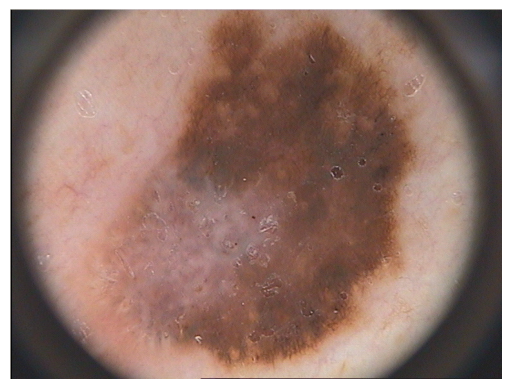

<ipython-input-5-dfd1706be908>:219: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_weights = compute_entropy_weights(img, map_size)
<ipython-input-5-dfd1706be908>:47: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)


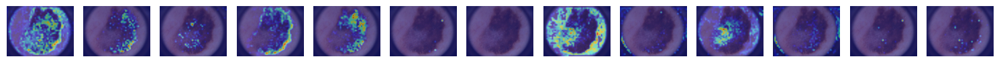

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=3):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)
    return attn_map

def clip_encode_dense(x, n=3):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

# Entropy weights computation
def compute_entropy_weights(img, map_size):
    gray_img = rgb2gray(np.asarray(img))
    entropy_map = entropy(gray_img, disk(5))
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())

    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)
    return torch.tensor(entropy_resized, device=device).view(-1)

# Cosine similarity weights computation
def compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device="cuda"):
    p_final = F.normalize(outputs[:, 1:], dim=-1)
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)
    cosine_sim = cosine_sim[0].reshape(*map_size)

    cosine_sim -= cosine_sim.min()
    cosine_sim /= cosine_sim.max()
    return cosine_sim.view(-1).to(device)

# # Combine entropy and cosine similarity weights
# def compute_combined_weights(img, outputs, text_embeddings, map_size, device="cuda"):
#     entropy_weights = compute_entropy_weights(img, map_size)
#     cosine_weights = compute_cosine_similarity_weights(outputs, text_embeddings, map_size, device=device)

#     # entropy_weights = entropy_weights / entropy_weights.sum()
#     # cosine_weights = cosine_weights / cosine_weights.sum()

#     # combined_weights = (entropy_weights + cosine_weights) / 2
#     # combined_weights = (2*(entropy_weights * cosine_weights)) / (entropy_weights + cosine_weights)
#     # combined_weights = (entropy_weights * cosine_weights)
#     # combined_weights = (0.1 * entropy_weights + 0.9 * cosine_weights) / (0.1 + 0.9)
#     # combined_weights = cosine_weights
#     return combined_weights

# Modified Grad-ECLIP function using combined weights
def grad_eclip_with_combined_weights(c, qs, ks, vs, attn_outputs, map_size, entropy_weights,cosine_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, entropy_weights,cosine_weights, device)
        tmp_maps.append(weighted_aggregate)

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)
    return emap.reshape(*map_size)

# Aggregation function
def weighted_gradient_aggregation(grad_cls, v_patch,entropy_weights, weights, device="cuda"):
    weights = weights.to(device)
    weights = weights / weights.sum()
    weighted_grad = (grad_cls * v_patch) * weights[:, None] * entropy_weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)
    return aggregated_grad

# Visualization and final usage
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
         "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules",
#          "absent blue-whitish veil", "symmetric in 1 axes", "light-brown color", "dark-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Text and image embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
cosine = (ori_img_embedding @ text_embedding.T)

# Image processing through the CLIP encoder
img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute combined weights
# combined_weights = compute_combined_weights(img, outputs, text_embedding, map_size, device="cuda")
entropy_weights = compute_entropy_weights(img, map_size)
cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")
# combined_weights = (0.1 * entropy_weights + 0.9 * cosine_weights) / (0.1 + 0.9)
# Generate Grad-ECLIP maps using combined weights
grad_emaps = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_combined_weights(c, qs, ks, vs, atten_outs, map_size, entropy_weights,cosine_weights, device="cuda"))

# Visualization
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=1, figsize=(15, 6))

for i, ax in enumerate(axs):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax.axis('off')
    ax.imshow(c_ret)

fig.tight_layout()
plt.show()


<ipython-input-9-478571a75abe>:157: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_weights = compute_weighted_entropy(img, map_size, device=device)


tensor([0.0003, 0.0003, 0.0004,  ..., 0.0005, 0.0003, 0.0005], device='cuda:0',
       dtype=torch.float64)


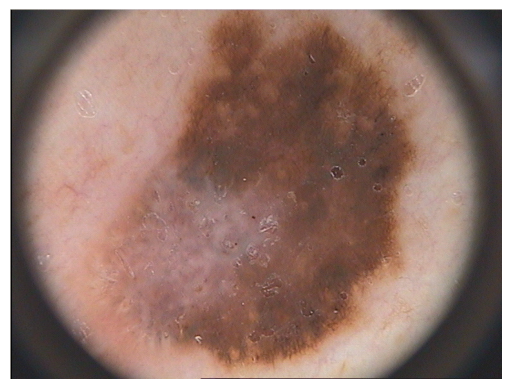

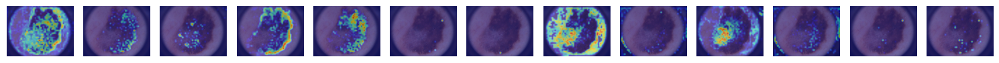

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

# # Load the CLIP model architecture
# clipmodel, preprocess = clip.load("ViT-B/16", device=device)
# clip_inres = clipmodel.visual.input_resolution
# clip_ksize = clipmodel.visual.conv1.kernel_size

# # Load your fine-tuned model weights
# clipmodel.load_state_dict(torch.load("/content/trainedmodel_B16_64_1.pth", map_location=device))

# # Set the model to evaluation mode
# clipmodel.eval()

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

def attention_layer(q, k, v, num_heads=1):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def aggregate_layers(attns, layers_to_aggregate=3):
    """Aggregate attention maps from the last N transformer layers."""
    if len(attns) < layers_to_aggregate:
        layers_to_aggregate = len(attns)
    attn_map = torch.stack(attns[-layers_to_aggregate:]).mean(0)
    return attn_map

def clip_encode_dense(x, n=3):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64

    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)
    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)
    x = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-n])(x)

    attns = []
    atten_outs = []
    vs = []
    qs = []
    ks = []
    for TR in clipmodel.visual.transformer.resblocks[-n:]:
        x_in = x
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1)
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        qs.append(q)
        ks.append(k)

        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))

    aggregated_attn_map = aggregate_layers(attns, layers_to_aggregate=n)

    x = x.permute(1, 0, 2)
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj
    return x, x_in, vs, qs, ks, aggregated_attn_map, atten_outs, (feah, feaw)

# Compute weighted entropy map
def compute_weighted_entropy(img, map_size, device="cuda"):
    gray_img = rgb2gray(np.asarray(img))
    entropy_map = entropy(gray_img, disk(5))
    entropy_map = (entropy_map - entropy_map.min()) / (entropy_map.max() - entropy_map.min())

    entropy_resized = cv2.resize(entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)
    entropy_weights = torch.tensor(entropy_resized, device=device).view(-1)
    entropy_weights /= entropy_weights.sum()  # Normalizing so it sums to 1
    return entropy_weights

# Compute weighted cosine similarity map
def compute_weighted_cosine_similarity(outputs, text_embeddings, map_size, device="cuda"):
    p_final = F.normalize(outputs[:, 1:], dim=-1)
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)
    cosine_sim = cosine_sim[0].reshape(*map_size)

    cosine_sim -= cosine_sim.min()
    cosine_sim /= cosine_sim.max()
    cosine_weights = cosine_sim.view(-1).to(device)
    cosine_weights /= cosine_weights.sum()  # Normalizing so it sums to 1
    return cosine_weights

# Combine weighted entropy and cosine similarity maps
def compute_combined_weights(img, outputs, text_embeddings, map_size, device="cuda"):
    entropy_weights = compute_weighted_entropy(img, map_size, device=device)
    cosine_weights = compute_weighted_cosine_similarity(outputs, text_embeddings, map_size, device=device)
    print(entropy_weights)

    # Combine using an average or harmonic mean, ensuring equal influence
    combined_weights = (entropy_weights + cosine_weights) / 2
    # Or using harmonic mean to give equal contribution without one overshadowing
    # combined_weights = (2 * (entropy_weights * cosine_weights)) / (entropy_weights + cosine_weights)

    return combined_weights

# Usage of the modified function
combined_weights = compute_combined_weights(img, outputs, text_embedding, map_size, device="cuda")


# Modified Grad-ECLIP function using combined weights
def grad_eclip_with_combined_weights(c, qs, ks, vs, attn_outputs, map_size, combined_weights, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, combined_weights, device)
        tmp_maps.append(weighted_aggregate)

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)
    return emap.reshape(*map_size)

# Aggregation function
def weighted_gradient_aggregation(grad_cls, v_patch, weights, device="cuda"):
    weights = weights.to(device)
    weights = weights / weights.sum()
    weighted_grad = (grad_cls * v_patch) * weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)
    return aggregated_grad

# Visualization and final usage
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
         "missing pigmentation"]
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules",
#          "absent blue-whitish veil", "symmetric in 1 axes", "light-brown color", "dark-brown color", "missing vascular_structures", "missing pigmentation"]

plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Text and image embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
cosine = (ori_img_embedding @ text_embedding.T)

# Image processing through the CLIP encoder
img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute combined weights
# combined_weights = compute_combined_weights(img, outputs, text_embedding, map_size, device="cuda")
# entropy_weights = compute_entropy_weights(img, map_size)
# cosine_weights = compute_cosine_similarity_weights(outputs, text_embedding, map_size, device="cuda")
# combined_weights = (0.1 * entropy_weights + 0.9 * cosine_weights) / (0.1 + 0.9)
# Generate Grad-ECLIP maps using combined weights
grad_emaps = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_combined_weights(c, qs, ks, vs, atten_outs, map_size, combined_weights, device="cuda"))

# Visualization
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=1, figsize=(15, 6))

for i, ax in enumerate(axs):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax.axis('off')
    ax.imshow(c_ret)

fig.tight_layout()
plt.show()


text aware localized entropy

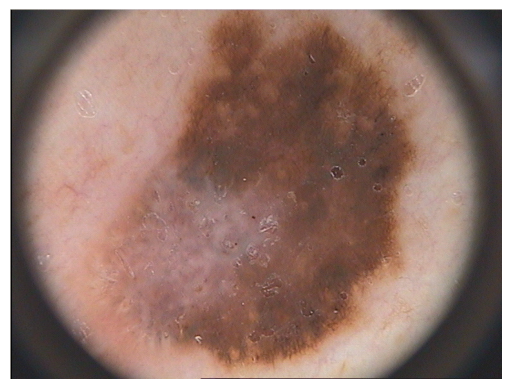

<ipython-input-4-1ab283d72bba>:126: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  text_aware_entropy = compute_localized_entropy_with_text_filtering(img, outputs, text_embedding, map_size, patch_size=16, device="cuda")


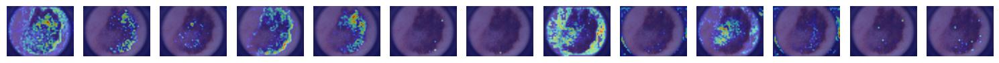

In [ ]:
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, InterpolationMode
import clip
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.filters.rank import entropy
from skimage.morphology import disk
from skimage.color import rgb2gray

# Set the device
device = "cuda" if torch.cuda.is_available() else "cpu"

_transform = Compose([
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
])

def imgprocess(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)

def visualize(map, raw_image, resize):
    image = np.asarray(raw_image.copy())
    map = resize(map.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((map * 255).astype(np.uint8), cv2.COLORMAP_JET)
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    return c_ret

# Localized Entropy Calculation with Text-Aware Filtering
def compute_localized_entropy_with_text_filtering(img, outputs, text_embeddings, map_size, patch_size=16, device="cuda"):
    gray_img = rgb2gray(np.asarray(img))  # Convert to grayscale
    localized_entropy_map = np.zeros(gray_img.shape)

    # Calculate entropy over patches
    for i in range(0, gray_img.shape[0], patch_size):
        for j in range(0, gray_img.shape[1], patch_size):
            # Extract the patch
            patch = gray_img[i:i+patch_size, j:j+patch_size]
            # Compute entropy for the patch
            patch_entropy = entropy(patch, disk(5))
            # Normalize patch entropy
            patch_entropy = (patch_entropy - patch_entropy.min()) / (patch_entropy.max() - patch_entropy.min())
            localized_entropy_map[i:i+patch_size, j:j+patch_size] = patch_entropy

    # Resize entropy map to match model map size
    entropy_resized = cv2.resize(localized_entropy_map, map_size[::-1], interpolation=cv2.INTER_LINEAR)
    entropy_weights = torch.tensor(entropy_resized, device=device).view(-1)

    # Calculate cosine similarity between each patch and text embeddings
    p_final = F.normalize(outputs[:, 1:], dim=-1)
    cosine_sim = (p_final @ text_embeddings.T).mean(dim=-1)
    cosine_sim = cosine_sim[0].reshape(*map_size)
    cosine_sim -= cosine_sim.min()
    cosine_sim /= cosine_sim.max()
    cosine_weights = cosine_sim.view(-1).to(device)

    # Apply text-aware filtering by weighting entropy by cosine similarity
    text_aware_entropy = entropy_weights * cosine_weights
    text_aware_entropy /= text_aware_entropy.sum()  # Normalize

    return text_aware_entropy

# Grad-ECLIP function with text-aware localized entropy weights
def grad_eclip_with_text_aware_entropy(c, qs, ks, vs, attn_outputs, map_size, text_aware_entropy, device="cuda"):
    tmp_maps = []
    for q, k, v, attn_output in zip(qs, ks, vs, attn_outputs):
        grad = torch.autograd.grad(c, attn_output, retain_graph=True)[0].to(device)
        grad_cls = grad[:1, 0, :].to(device)
        v_patch = v[1:, 0, :].to(device)
        weighted_aggregate = weighted_gradient_aggregation(grad_cls, v_patch, text_aware_entropy, device)
        tmp_maps.append(weighted_aggregate)

    emap = F.relu_(torch.stack(tmp_maps, dim=0)).sum(0).to(device)
    return emap.reshape(*map_size)

# Aggregation function
def weighted_gradient_aggregation(grad_cls, v_patch, weights, device="cuda"):
    weights = weights.to(device)
    weights = weights / weights.sum()
    weighted_grad = (grad_cls * v_patch) * weights[:, None]
    aggregated_grad = weighted_grad.sum(-1)
    return aggregated_grad

# Visualization and final usage
img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
# texts = ["atypical nevus", "atypical pigmented", "absent streaks", "absent regression areas", "absent dots/globules",
#          "absent blue-whitish veil", "symmetric in 1 axes", "light-brown color", "dark-brown color", "missing vascular_structures", "missing pigmentation"]
texts = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "absent blue whitish veil", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color", "missing vascular structures",
         "missing pigmentation"]
plt.imshow(img)
plt.axis('off')
plt.show()

img_preprocessed = preprocess(img).cuda().unsqueeze(0)
text_processed = clip.tokenize(texts).cuda()

# Text and image embeddings
text_embedding = clipmodel.encode_text(text_processed)
text_embedding = F.normalize(text_embedding, dim=-1)
ori_img_embedding = clipmodel.encode_image(img_preprocessed)
ori_img_embedding = F.normalize(ori_img_embedding, dim=-1)
cosine = (ori_img_embedding @ text_embedding.T)

# Image processing through the CLIP encoder
img_preprocessed_k = imgprocess(img).cuda().unsqueeze(0)
outputs, last_feat, vs, qs, ks, attns, atten_outs, map_size = clip_encode_dense(img_preprocessed_k, n=1)
img_embedding = F.normalize(outputs[:, 0], dim=-1)
cosine = (img_embedding @ text_embedding.T)[0]

# Compute localized entropy with text-aware filtering
text_aware_entropy = compute_localized_entropy_with_text_filtering(img, outputs, text_embedding, map_size, patch_size=16, device="cuda")

# Generate Grad-ECLIP maps using text-aware entropy
grad_emaps = []
for i, c in enumerate(cosine):
    grad_emaps.append(grad_eclip_with_text_aware_entropy(c, qs, ks, vs, atten_outs, map_size, text_aware_entropy, device="cuda"))

# Visualization
h, w = img.size
resize = T.Resize((w, h))
fig, axs = plt.subplots(ncols=len(cosine), nrows=1, figsize=(15, 6))

for i, ax in enumerate(axs):
    tmp = grad_emaps[i].clone()
    tmp -= tmp.min()
    tmp /= tmp.max()
    c_ret = visualize(tmp.detach().cpu(), img, resize)
    ax.axis('off')
    ax.imshow(c_ret)

fig.tight_layout()
plt.show()


In [ ]:
def pairwise_region_perturbation(img, grad_map, model, text_input, target_class, patch_size=16):
    """
    Perform pairwise region perturbation to measure feature interaction effects.
    """
    img_array = np.asarray(img)
    perturbed_probs = []

    # Divide the image into patches
    h, w = img_array.shape[:2]
    num_patches_x = w // patch_size
    num_patches_y = h // patch_size

    # Detach grad_map from the computation graph and convert to numpy array for sorting
    grad_map_np = grad_map.detach().cpu().numpy()
    sorted_indices = np.argsort(-grad_map_np.ravel())  # Sort in descending order of importance
    patch_indices = [(i // num_patches_x, i % num_patches_x) for i in sorted_indices]

    # Loop over patch pairs
    for idx, (y1, x1) in enumerate(patch_indices):
        for y2, x2 in patch_indices[idx + 1:]:
            perturbed_img = img_array.copy()

            # Perturb the first patch by setting it to a constant value (gray)
            perturbed_img[y1*patch_size:(y1+1)*patch_size, x1*patch_size:(x1+1)*patch_size] = 128

            # Perturb the second patch in the same way
            perturbed_img[y2*patch_size:(y2+1)*patch_size, x2*patch_size:(x2+1)*patch_size] = 128

            # Convert perturbed image to tensor using the CLIP-specific preprocess function
            perturbed_tensor = preprocess(Image.fromarray(perturbed_img)).unsqueeze(0).to(device)

            # Measure the model's output on the perturbed image with the text input
            with torch.no_grad():
                logits_per_image, logits_per_text = model(perturbed_tensor, text_input)
                prob = torch.softmax(logits_per_image[0], dim=0)[target_class].item()
            perturbed_probs.append({
                'pair': ((y1, x1), (y2, x2)),
                'probability': prob
            })

    return perturbed_probs



# Run pairwise perturbation
# pairwise_probs = pairwise_region_perturbation(img, grad_emaps[0], clipmodel, target_class=0, patch_size=16)
# Run pairwise perturbation with text input (assuming `text_processed` is your tokenized text input)
pairwise_probs = pairwise_region_perturbation(img, grad_emaps[0], clipmodel, text_processed, target_class=0, patch_size=16)

# Plot probability changes
interactions = [p['probability'] for p in pairwise_probs]
pairs = [p['pair'] for p in pairwise_probs]

plt.figure(figsize=(12, 6))
plt.plot(range(len(interactions)), interactions, marker='o')
plt.xticks(range(len(pairs)), labels=[str(p) for p in pairs], rotation=90)
plt.xlabel("Patch Pair")
plt.ylabel("Model's Probability for Target Class")
plt.title("Probability Change Due to Pairwise Perturbation")
plt.show()



KeyboardInterrupt: 

<ipython-input-9-478571a75abe>:157: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_weights = compute_weighted_entropy(img, map_size, device=device)


tensor([0.0037, 0.0032, 0.0065, 0.0035, 0.0039, 0.0043, 0.0062, 0.0062, 0.0064,
        0.0037, 0.0053, 0.0060, 0.0031, 0.0022, 0.0036, 0.0048, 0.0042, 0.0037,
        0.0043, 0.0049, 0.0052, 0.0069, 0.0044, 0.0068, 0.0065, 0.0077, 0.0048,
        0.0038, 0.0024, 0.0067, 0.0049, 0.0049, 0.0047, 0.0054, 0.0042, 0.0049,
        0.0061, 0.0054, 0.0067, 0.0066, 0.0063, 0.0043, 0.0024, 0.0053, 0.0041,
        0.0027, 0.0052, 0.0050, 0.0063, 0.0055, 0.0042, 0.0064, 0.0054, 0.0057,
        0.0068, 0.0037, 0.0056, 0.0033, 0.0048, 0.0049, 0.0050, 0.0063, 0.0057,
        0.0047, 0.0036, 0.0042, 0.0031, 0.0051, 0.0033, 0.0034, 0.0076, 0.0040,
        0.0052, 0.0035, 0.0070, 0.0043, 0.0035, 0.0048, 0.0049, 0.0050, 0.0034,
        0.0078, 0.0052, 0.0050, 0.0076, 0.0047, 0.0042, 0.0046, 0.0036, 0.0068,
        0.0049, 0.0042, 0.0060, 0.0059, 0.0062, 0.0036, 0.0032, 0.0056, 0.0075,
        0.0028, 0.0024, 0.0057, 0.0073, 0.0043, 0.0056, 0.0067, 0.0061, 0.0045,
        0.0045, 0.0031, 0.0041, 0.0056, 

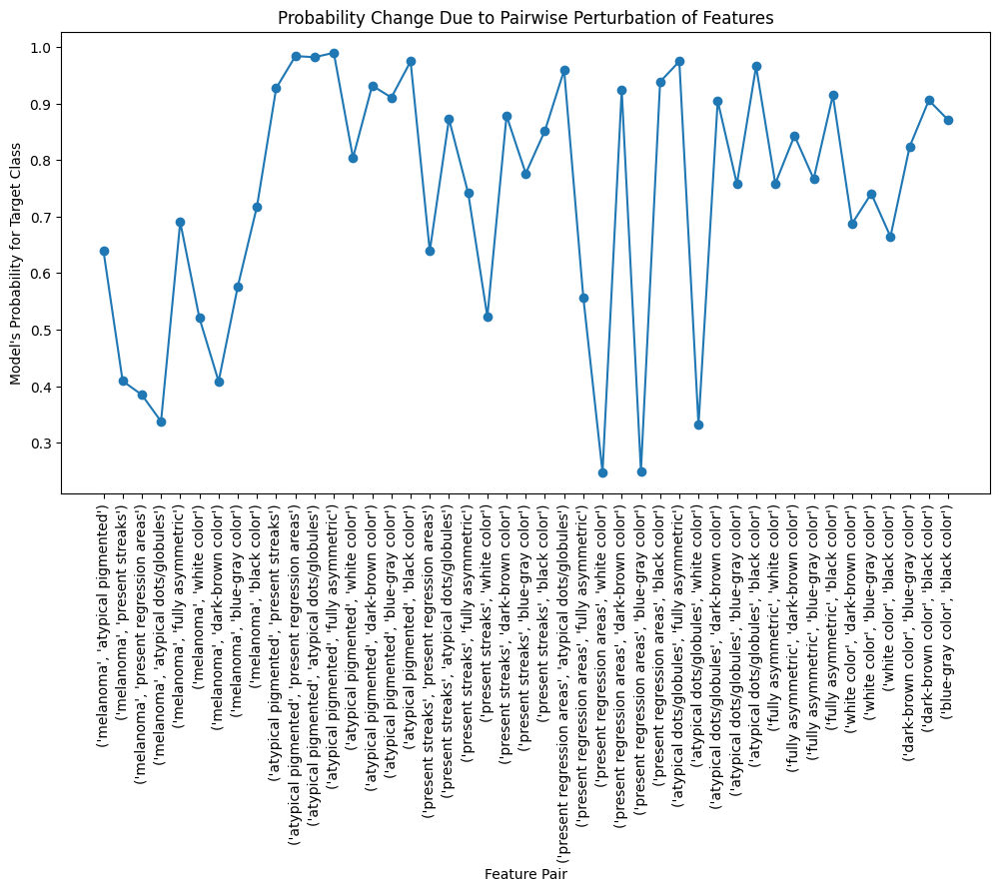

In [ ]:
import numpy as np
import torch
import cv2
from PIL import Image

def pairwise_text_feature_perturbation(img, model, text_input, feature_descriptions, patch_size=16):

    img_array = np.asarray(img)
    h, w = img_array.shape[:2]
    perturbed_probs = []

    # Generate text embeddings for each feature description
    text_embeddings = model.encode_text(clip.tokenize(feature_descriptions).to(device))
    text_embeddings = F.normalize(text_embeddings, dim=-1)

    # Preprocess the image and encode it
    img_preprocessed = preprocess(img).to(device).unsqueeze(0)
    outputs, _, vs, qs, ks, _, atten_outs, map_size = clip_encode_dense(img_preprocessed, n=1)

    # Compute combined weights for explainability
    combined_weights = compute_combined_weights(img, outputs, text_embeddings, map_size, device=device)

    # Create Grad-ECLIP maps using combined weights for each feature description
    grad_maps = []
    for i, text_embedding in enumerate(text_embeddings):
        cosine = F.cosine_similarity(outputs[:, 0], text_embedding, dim=-1)
        grad_map = grad_eclip_with_combined_weights(cosine, qs, ks, vs, atten_outs, map_size, combined_weights, device=device)
        grad_maps.append(grad_map)

    # Loop over each pair of features
    for i, feature1 in enumerate(feature_descriptions):
        for j, feature2 in enumerate(feature_descriptions[i+1:], start=i+1):
            perturbed_img = img_array.copy()

            # Perturb patches based on resized Grad-ECLIP maps of feature1 and feature2
            grad_map1 = cv2.resize(grad_maps[i].detach().cpu().numpy(), (w, h))
            grad_map2 = cv2.resize(grad_maps[j].detach().cpu().numpy(), (w, h))
            perturbed_img[grad_map1 > grad_map1.mean()] = 128  # Set high-importance areas of feature1 to gray
            perturbed_img[grad_map2 > grad_map2.mean()] = 128  # Set high-importance areas of feature2 to gray

            perturbed_tensor = preprocess(Image.fromarray(perturbed_img)).unsqueeze(0).to(device)

            # Measure the model's output on the perturbed image with the text input
            with torch.no_grad():
                logits_per_image, logits_per_text = model(perturbed_tensor, text_input)
                prob = torch.softmax(logits_per_image[0], dim=0)[0].item()  # Assume target_class=0 as default
            perturbed_probs.append({
                'pair': (feature1, feature2),
                'probability': prob
            })

    return perturbed_probs

img_path = "/content/IMD088.bmp"r
img = Image.open(img_path).convert("RGB")
# feature_descriptions = ["melanoma", "regression areas", "present streaks", "atypical dots/globules", "blue-gray color"]
feature_descriptions =["melanoma", "atypical pigmented", "present streaks", "present regression areas",
         "atypical dots/globules", "fully asymmetric",
         "white color", "dark-brown color", "blue-gray color", "black color"]
preprocessed_img = preprocess(img).to(device).unsqueeze(0)
text_processed = clip.tokenize(feature_descriptions).to(device)
pairwise_probs = pairwise_text_feature_perturbation(img, clipmodel, text_processed, feature_descriptions, patch_size=16)

# Plot probability changes
interactions = [p['probability'] for p in pairwise_probs]
pairs = [p['pair'] for p in pairwise_probs]

plt.figure(figsize=(12, 6))
plt.plot(range(len(interactions)), interactions, marker='o')
plt.xticks(range(len(pairs)), labels=[str(p) for p in pairs], rotation=90)
plt.xlabel("Feature Pair")
plt.ylabel("Model's Probability for Target Class")
plt.title("Probability Change Due to Pairwise Perturbation of Features")
plt.show()

<ipython-input-9-478571a75abe>:157: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  entropy_weights = compute_weighted_entropy(img, map_size, device=device)


tensor([0.0037, 0.0032, 0.0065, 0.0035, 0.0039, 0.0043, 0.0062, 0.0062, 0.0064,
        0.0037, 0.0053, 0.0060, 0.0031, 0.0022, 0.0036, 0.0048, 0.0042, 0.0037,
        0.0043, 0.0049, 0.0052, 0.0069, 0.0044, 0.0068, 0.0065, 0.0077, 0.0048,
        0.0038, 0.0024, 0.0067, 0.0049, 0.0049, 0.0047, 0.0054, 0.0042, 0.0049,
        0.0061, 0.0054, 0.0067, 0.0066, 0.0063, 0.0043, 0.0024, 0.0053, 0.0041,
        0.0027, 0.0052, 0.0050, 0.0063, 0.0055, 0.0042, 0.0064, 0.0054, 0.0057,
        0.0068, 0.0037, 0.0056, 0.0033, 0.0048, 0.0049, 0.0050, 0.0063, 0.0057,
        0.0047, 0.0036, 0.0042, 0.0031, 0.0051, 0.0033, 0.0034, 0.0076, 0.0040,
        0.0052, 0.0035, 0.0070, 0.0043, 0.0035, 0.0048, 0.0049, 0.0050, 0.0034,
        0.0078, 0.0052, 0.0050, 0.0076, 0.0047, 0.0042, 0.0046, 0.0036, 0.0068,
        0.0049, 0.0042, 0.0060, 0.0059, 0.0062, 0.0036, 0.0032, 0.0056, 0.0075,
        0.0028, 0.0024, 0.0057, 0.0073, 0.0043, 0.0056, 0.0067, 0.0061, 0.0045,
        0.0045, 0.0031, 0.0041, 0.0056, 

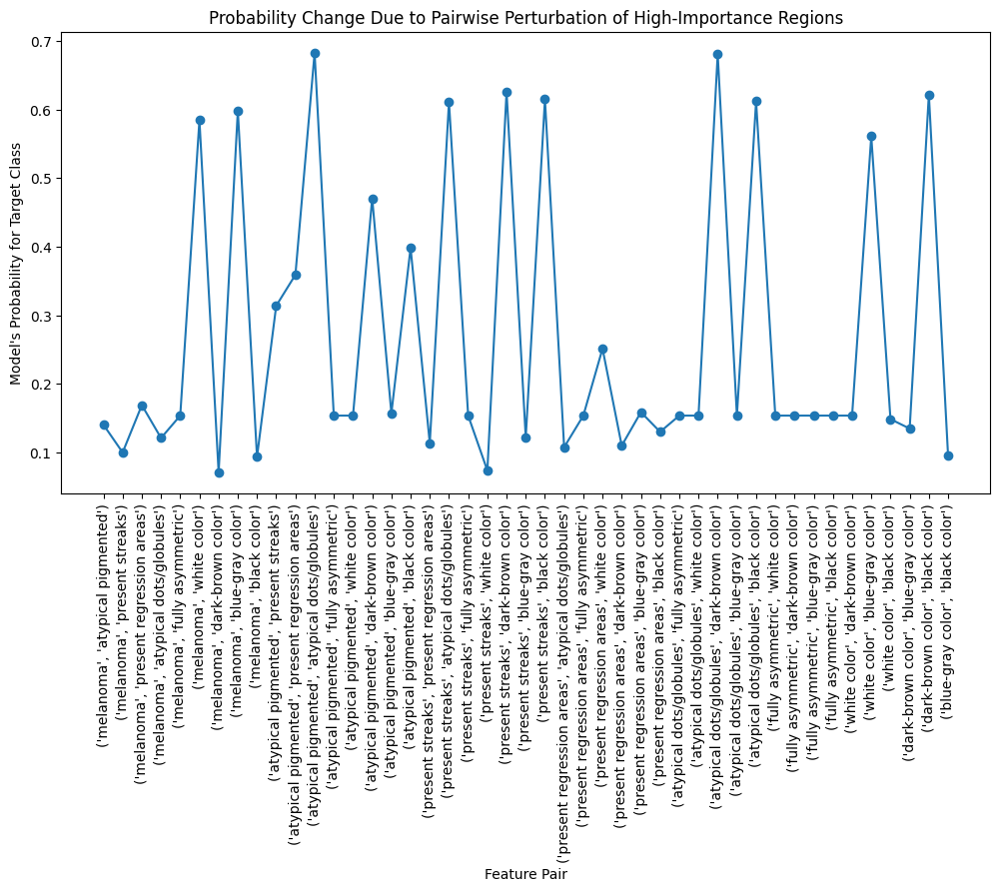

In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
import cv2
from PIL import Image
import matplotlib.pyplot as plt

def pairwise_text_feature_perturbation_high_importance(img, model, text_input, feature_descriptions, patch_size=16, threshold=0.8):
    """
    Perform pairwise perturbation using high-importance regions based on Grad-E maps for each feature pair.
    This computes the probability impact on the target features for interpretability using Grad-ECLIP.
    """
    img_array = np.asarray(img)
    h, w = img_array.shape[:2]
    perturbed_probs = []

    # Generate text embeddings for each feature description
    text_embeddings = model.encode_text(clip.tokenize(feature_descriptions).to(device))
    text_embeddings = F.normalize(text_embeddings, dim=-1)

    # Preprocess the image and encode it
    img_preprocessed = preprocess(img).to(device).unsqueeze(0)
    outputs, _, vs, qs, ks, _, atten_outs, map_size = clip_encode_dense(img_preprocessed, n=1)

    # Compute combined weights for explainability
    combined_weights = compute_combined_weights(img, outputs, text_embeddings, map_size, device=device)

    # Create Grad-ECLIP maps using combined weights for each feature description
    grad_maps = []
    for i, text_embedding in enumerate(text_embeddings):
        cosine = F.cosine_similarity(outputs[:, 0], text_embedding, dim=-1)
        grad_map = grad_eclip_with_combined_weights(cosine, qs, ks, vs, atten_outs, map_size, combined_weights, device=device)
        grad_maps.append(grad_map)

    # Loop over each pair of features
    for i, feature1 in enumerate(feature_descriptions):
        for j, feature2 in enumerate(feature_descriptions[i+1:], start=i+1):
            perturbed_img = img_array.copy()

            # Perturb only the high-importance patches based on Grad-E maps of feature1 and feature2
            grad_map1 = cv2.resize(grad_maps[i].detach().cpu().numpy(), (w, h))
            grad_map2 = cv2.resize(grad_maps[j].detach().cpu().numpy(), (w, h))

            # Apply threshold to identify high-importance regions
            high_importance_mask1 = grad_map1 > np.percentile(grad_map1, threshold * 100)
            high_importance_mask2 = grad_map2 > np.percentile(grad_map2, threshold * 100)

            # Perturb the overlapping high-importance regions
            perturbed_img[high_importance_mask1 & high_importance_mask2] = 128  # Set high-importance areas to gray

            # Convert perturbed image to tensor using CLIP's preprocess function
            perturbed_tensor = preprocess(Image.fromarray(perturbed_img)).unsqueeze(0).to(device)

            # Measure the model's output on the perturbed image with the text input
            with torch.no_grad():
                logits_per_image, logits_per_text = model(perturbed_tensor, text_input)
                prob = torch.softmax(logits_per_image[0], dim=0)[0].item()  # Assume target_class=0 as default
            perturbed_probs.append({
                'pair': (feature1, feature2),
                'probability': prob
            })

    return perturbed_probs

img_path = "/content/IMD088.bmp"
img = Image.open(img_path).convert("RGB")
feature_descriptions = ["melanoma", "atypical pigmented", "present streaks", "present regression areas",
                        "atypical dots/globules", "fully asymmetric",
                        "white color", "dark-brown color", "blue-gray color", "black color"]
preprocessed_img = preprocess(img).to(device).unsqueeze(0)
text_processed = clip.tokenize(feature_descriptions).to(device)

# Run pairwise perturbation with high-importance regions based on Grad-E maps
pairwise_probs = pairwise_text_feature_perturbation_high_importance(img, clipmodel, text_processed, feature_descriptions, patch_size=16)

# Plot probability changes
interactions = [p['probability'] for p in pairwise_probs]
pairs = [p['pair'] for p in pairwise_probs]

plt.figure(figsize=(12, 6))
plt.plot(range(len(interactions)), interactions, marker='o')
plt.xticks(range(len(pairs)), labels=[str(p) for p in pairs], rotation=90)
plt.xlabel("Feature Pair")
plt.ylabel("Model's Probability for Target Class")
plt.title("Probability Change Due to Pairwise Perturbation of High-Importance Regions")
plt.show()


In [ ]:
! pip install ftfy regex tqdm
## CLIP
! pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-74uf89eu
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-74uf89eu
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [ ]:
## CLIPSurgery
! git clone https://github.com/xmed-lab/CLIP_Surgery.git

Cloning into 'CLIP_Surgery'...
remote: Enumerating objects: 59, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (41/41), done.
remote: Total 59 (delta 25), reused 50 (delta 16), pack-reused 0 (from 0)
Receiving objects: 100% (59/59), 15.82 MiB | 26.64 MiB/s, done.
Resolving deltas: 100% (25/25), done.


In [ ]:
## GAME
! git clone https://github.com/hila-chefer/Transformer-MM-Explainability.git
! mv Transformer-MM-Explainability/CLIP Game_MM_CLIP
! rm -rf Transformer-MM-Explainability

Cloning into 'Transformer-MM-Explainability'...
remote: Enumerating objects: 1477, done.
remote: Counting objects: 100% (153/153), done.
remote: Compressing objects: 100% (68/68), done.
remote: Total 1477 (delta 90), reused 85 (delta 85), pack-reused 1324 (from 1)
Receiving objects: 100% (1477/1477), 25.57 MiB | 13.58 MiB/s, done.
Resolving deltas: 100% (578/578), done.


In [ ]:
import os
import cv2
import math
import clip
import json
import numpy as np
from clip import tokenize
import torch
from PIL import Image
import torchvision.transforms as T
from torchvision.transforms import Normalize, Compose, InterpolationMode, ToTensor, Resize
import torch.nn.functional as F
from skimage.transform import resize as np_resize

import Game_MM_CLIP.clip as mm_clip
import CLIP_Surgery.clip as surgery_clip

# from M2IB.scripts.clip_wrapper import ClipWrapper
# from M2IB.scripts.methods import vision_heatmap_iba, text_heatmap_iba
from transformers import CLIPTokenizerFast

from tqdm import tqdm
# import sys
# sys.path.append('/content/M2IB/scripts')

_transform = Compose([
        ToTensor(),
        Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)),
    ])
def imgprocess_keepsize(img, patch_size=[16, 16], scale_factor=1):
    w, h = img.size
    ph, pw = patch_size
    nw = int(w * scale_factor / pw + 0.5) * pw
    nh = int(h * scale_factor / ph + 0.5) * ph

    ResizeOp = Resize((nh, nw), interpolation=InterpolationMode.BICUBIC)
    img = ResizeOp(img).convert("RGB")
    return _transform(img)


# CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
clipmodel, preprocess = clip.load("ViT-B/16", device=device)
mm_clipmodel, _ = mm_clip.load("ViT-B/16", device=device, jit=False)
surgery_model, _ = surgery_clip.load("CS-ViT-B/16", device=device)

# clipmodel, preprocess = clip.load("ViT-B/32", device=device)
# mm_clipmodel, _ = mm_clip.load("ViT-B/32", device=device, jit=False)
# surgery_model, _ = surgery_clip.load("CS-ViT-B/32", device=device)
# clipmodel.load_state_dict(torch.load("clip-imp-pretrained_128_6_after_4.pt", map_location=device))
# mm_clipmodel.load_state_dict(torch.load("clip-imp-pretrained_128_6_after_4.pt", map_location=device))
# surgery_model.load_state_dict(torch.load("clip-imp-pretrained_128_6_after_4.pt", map_location=device))

clip_tokenizer = CLIPTokenizerFast.from_pretrained("openai/clip-vit-base-patch16")
# m2ib_model = ClipWrapper(clipmodel)

def accuracy(output, target, topk=(1,)):
    pred = output.topk(max(topk), 1, True, True)[1].t()
    # print("pred:", pred.shape) # [5,1]
    correct = pred.eq(target.view(1, -1).expand_as(pred))
    acc = [float(correct[:k].reshape(-1).float().sum(0, keepdim=True).cpu().numpy()) for k in topk]
    pred_top1 = pred[0,:]
    return acc, pred_top1


def generate_masks(input_size, N, s, p1):
    cell_size = np.ceil(np.array(input_size) / s)
    up_size = (s + 1) * cell_size

    grid = np.random.rand(N, s, s) < p1
    grid = grid.astype('float32')

    masks = np.empty((N, *input_size))
    for i in tqdm(range(N), desc='Generating masks'):
        # Random shifts
        x = np.random.randint(0, cell_size[0])
        y = np.random.randint(0, cell_size[1])
        # Linear upsampling and cropping
        masks[i, :, :] = np_resize(grid[i], up_size, order=1, mode='reflect',
                                anti_aliasing=False)[x:x + input_size[0], y:y + input_size[1]]
    masks = masks.reshape(-1, 1, *input_size)
    return torch.tensor(masks)


### RISE
def rise(model, image, txt_embedding, device, N=2000, s=8, p1=0.5):
    input_size = image.shape[-2:]
    masks = generate_masks(input_size, N, s, p1)
    batch_size = 50
    preds = []
    # Make sure multiplication is being done for correct axes
    masked = image * masks
    with torch.no_grad():
        for i in tqdm(range(0, N, batch_size), desc='Explaining'):
            image_features = model.encode_image(masked[i:min(i+batch_size, N)].to(device))
            image_features = F.normalize(image_features, dim=-1)
            preds.append((image_features @ txt_embedding.T).cpu())
            del image_features
    preds = torch.cat(preds, dim=0)
    sal = (preds * masks.reshape(N, -1)).sum(0).reshape(*input_size)
    sal = sal / N / p1
    return sal


# ### M2IB
# def m2ib_clip_map(model, image, texts, device, vbeta=0.1, vvar=1, vlayer=9, tbeta=0.1, tvar=1, tlayer=9):
#     text_ids = torch.tensor([clip_tokenizer.encode(texts, add_special_tokens=True)]).to(device)
#     vmap = vision_heatmap_iba(text_ids, image, model, vlayer, vbeta, vvar)
#     return vmap

# def m2ib_clip_text_map(model, image, texts, device, vbeta=0.1, vvar=1, vlayer=9, tbeta=0.1, tvar=1, tlayer=9):
#     text_ids = torch.tensor([clip_tokenizer.encode(texts, add_special_tokens=True)]).to(device)
#     tmap = text_heatmap_iba(text_ids, image, model, tlayer, tbeta, tvar)
#     return tmap


### CLIPSurgery
def clip_surgery_map(model, image, texts, device):
    with torch.no_grad():
        # CLIP architecture surgery acts on the image encoder
        image_features = model.encode_image(image)
        image_features = image_features / image_features.norm(dim=1, keepdim=True)

        # Prompt ensemble for text features with normalization
        text_features = surgery_clip.encode_text_with_prompt_ensemble(model, texts, device)

        # Apply feature surgery
        similarity = surgery_clip.clip_feature_surgery(image_features, text_features)
        similarity_map = surgery_clip.get_similarity_map(similarity[:, 1:, :], image.shape[-2:])
    return similarity_map


### GAME
def mm_interpret(image, texts, model, device, start_layer=-1, start_layer_text=-1, flag="image", rollout=False):
    batch_size = texts.shape[0]
    images = image.repeat(batch_size, 1, 1, 1)
    logits_per_image, logits_per_text = model(images, texts)
    probs = logits_per_image.softmax(dim=-1).detach().cpu().numpy()
    index = [i for i in range(batch_size)]
    one_hot = np.zeros((logits_per_image.shape[0], logits_per_image.shape[1]), dtype=np.float32)
    one_hot[torch.arange(logits_per_image.shape[0]), index] = 1
    one_hot = torch.from_numpy(one_hot).requires_grad_(True)
    one_hot = torch.sum(one_hot.cuda() * logits_per_image)
    model.zero_grad()

    if flag == "image":
        image_attn_blocks = list(dict(model.visual.transformer.resblocks.named_children()).values())

        if start_layer == -1:
            # calculate index of last layer
            start_layer = len(image_attn_blocks) - 1

        num_tokens = image_attn_blocks[0].attn_probs.shape[-1]
        R = torch.eye(num_tokens, num_tokens, dtype=image_attn_blocks[0].attn_probs.dtype).to(device)
        R = R.unsqueeze(0).expand(batch_size, num_tokens, num_tokens)
        attentions = []
        for i, blk in enumerate(image_attn_blocks):
            if i < start_layer:
                continue
            grad = torch.autograd.grad(one_hot, [blk.attn_probs], retain_graph=True)[0].detach()
            cam = blk.attn_probs.detach()
            avg_heads = (cam.sum(dim=0) / cam.shape[0]).detach()
            attentions.append(avg_heads.unsqueeze(0))
            cam = cam.reshape(-1, cam.shape[-1], cam.shape[-1])
            grad = grad.reshape(-1, grad.shape[-1], grad.shape[-1])
            cam = grad * cam
            cam = cam.reshape(batch_size, -1, cam.shape[-1], cam.shape[-1])
            cam = cam.clamp(min=0).mean(dim=1)
            R = R + torch.bmm(cam, R)
        image_relevance = R[:, 0, 1:]
        dim = int(image_relevance[0].numel() ** 0.5)
        image_relevance = image_relevance.reshape(batch_size, dim, dim)
        if rollout:
            return attentions
        return image_relevance

    if flag == "text":
        text_attn_blocks = list(dict(model.transformer.resblocks.named_children()).values())

        if start_layer_text == -1:
            # calculate index of last layer
            start_layer_text = len(text_attn_blocks) - 1

        num_tokens = text_attn_blocks[0].attn_probs.shape[-1]
        R_text = torch.eye(num_tokens, num_tokens, dtype=text_attn_blocks[0].attn_probs.dtype).to(device)
        R_text = R_text.unsqueeze(0).expand(batch_size, num_tokens, num_tokens)
        attentions = []
        for i, blk in enumerate(text_attn_blocks):
            if i < start_layer_text:
                continue
            grad = torch.autograd.grad(one_hot, [blk.attn_probs], retain_graph=True)[0].detach()
            cam = blk.attn_probs.detach()
            avg_heads = (cam.sum(dim=0) / cam.shape[0]).detach()
            attentions.append(avg_heads.unsqueeze(0))
            cam = cam.reshape(-1, cam.shape[-1], cam.shape[-1])
            grad = grad.reshape(-1, grad.shape[-1], grad.shape[-1])
            cam = grad * cam
            cam = cam.reshape(batch_size, -1, cam.shape[-1], cam.shape[-1])
            cam = cam.clamp(min=0).mean(dim=1)
            R_text = R_text + torch.bmm(cam, R_text)
        text_relevance = R_text

        if rollout:
            return attentions
        return text_relevance

# compute rollout between attention layers
# copy codes from https://github.com/hila-chefer/Transformer-Explainability
def compute_rollout_attention(all_layer_matrices, start_layer=0, flag="image"):
    # adding residual consideration- code adapted from https://github.com/samiraabnar/attention_flow
    num_tokens = all_layer_matrices[0].shape[1]
    batch_size = all_layer_matrices[0].shape[0]
    eye = torch.eye(num_tokens).expand(batch_size, num_tokens, num_tokens).to(all_layer_matrices[0].device)
    all_layer_matrices = [all_layer_matrices[i] + eye for i in range(len(all_layer_matrices))]
    matrices_aug = [all_layer_matrices[i] / all_layer_matrices[i].sum(dim=-1, keepdim=True)
                          for i in range(len(all_layer_matrices))]
    joint_attention = matrices_aug[start_layer]
    for i in range(start_layer+1, len(matrices_aug)):
        joint_attention = matrices_aug[i].bmm(joint_attention)
    if flag=="text":
        return joint_attention
    if flag=="image":
        joint_attention = joint_attention[:, 0, 1:]
        dim = int(joint_attention[0].numel() ** 0.5)
        return joint_attention.reshape(batch_size, dim, dim)


def attention_layer(q, k, v, num_heads=1, attn_mask=None):
    "Compute 'Scaled Dot Product Attention'"
    tgt_len, bsz, embed_dim = q.shape
    head_dim = embed_dim // num_heads
    scaling = float(head_dim) ** -0.5
    q = q * scaling

    q = q.contiguous().view(tgt_len, bsz * num_heads, head_dim).transpose(0, 1)
    k = k.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    v = v.contiguous().view(-1, bsz * num_heads, head_dim).transpose(0, 1)
    attn_output_weights = torch.bmm(q, k.transpose(1, 2))
    if attn_mask is not None:
        attn_output_weights += attn_mask
    attn_output_weights = F.softmax(attn_output_weights, dim=-1)
    attn_output_heads = torch.bmm(attn_output_weights, v)
    assert list(attn_output_heads.size()) == [bsz * num_heads, tgt_len, head_dim]
    attn_output = attn_output_heads.transpose(0, 1).contiguous().view(tgt_len, bsz, embed_dim)
    attn_output_weights = attn_output_weights.view(bsz, num_heads, tgt_len, -1)
    attn_output_weights = attn_output_weights.sum(dim=1) / num_heads
    return attn_output, attn_output_weights

def clip_encode_dense(x):
    vision_width = clipmodel.visual.transformer.width
    vision_heads = vision_width // 64
    clip_inres = clipmodel.visual.input_resolution
    clip_ksize = clipmodel.visual.conv1.kernel_size

    # modified from CLIP
    x = x.half()
    x = clipmodel.visual.conv1(x)
    feah, feaw = x.shape[-2:]

    x = x.reshape(x.shape[0], x.shape[1], -1)
    x = x.permute(0, 2, 1)
    class_embedding = clipmodel.visual.class_embedding.to(x.dtype)

    x = torch.cat([class_embedding + torch.zeros(x.shape[0], 1, x.shape[-1]).to(x), x], dim=1)

    pos_embedding = clipmodel.visual.positional_embedding.to(x.dtype)
    tok_pos, img_pos = pos_embedding[:1, :], pos_embedding[1:, :]
    pos_h = clip_inres // clip_ksize[0]
    pos_w = clip_inres // clip_ksize[1]
    assert img_pos.size(0) == (pos_h * pos_w), f"the size of pos_embedding ({img_pos.size(0)}) does not match resolution shape pos_h ({pos_h}) * pos_w ({pos_w})"
    img_pos = img_pos.reshape(1, pos_h, pos_w, img_pos.shape[1]).permute(0, 3, 1, 2)
    img_pos = torch.nn.functional.interpolate(img_pos, size=(feah, feaw), mode='bicubic', align_corners=False)
    img_pos = img_pos.reshape(1, img_pos.shape[1], -1).permute(0, 2, 1)
    pos_embedding = torch.cat((tok_pos[None, ...], img_pos), dim=1)
    x = x + pos_embedding
    x = clipmodel.visual.ln_pre(x)

    x = x.permute(1, 0, 2)  # NLD -> LND
    x_in = torch.nn.Sequential(*clipmodel.visual.transformer.resblocks[:-1])(x)

    ##################
    # LastTR.attention
    targetTR = clipmodel.visual.transformer.resblocks[-1]
    x_before_attn = targetTR.ln_1(x_in)

    linear = torch._C._nn.linear
    q, k, v = linear(x_before_attn, targetTR.attn.in_proj_weight, targetTR.attn.in_proj_bias).chunk(3, dim=-1)
    attn_output, attn = attention_layer(q, k, v, 1) #vision_heads
    x_after_attn = linear(attn_output, targetTR.attn.out_proj.weight, targetTR.attn.out_proj.bias)

    x = x_after_attn + x_in
    x_out = x + targetTR.mlp(targetTR.ln_2(x))

    x = x_out.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.visual.ln_post(x)
    x = x @ clipmodel.visual.proj

    ## ==== get lastv ==============
    with torch.no_grad():
        qkv = torch.stack((q, k, v), dim=0)
        qkv = linear(qkv, targetTR.attn.out_proj.weight, targetTR.attn.out_proj.bias)
        q_out, k_out, v_out = qkv[0], qkv[1], qkv[2]

        v_final = v_out + x_in
        v_final = v_final + targetTR.mlp(targetTR.ln_2(v_final))
        v_final = v_final.permute(1, 0, 2)
        v_final = clipmodel.visual.ln_post(v_final)
        v_final = v_final @ clipmodel.visual.proj
    ##############

    return x, v_final[:,1:], x_in, v, q_out, k_out, attn, attn_output, (feah, feaw)


def clip_encode_text_dense(text, n):
    x = clipmodel.token_embedding(text).type(clipmodel.dtype)  # [batch_size, n_ctx, d_model]
    attn_mask=clipmodel.build_attention_mask().to(dtype=x.dtype, device=x.device)
    x = x + clipmodel.positional_embedding.type(clipmodel.dtype)
    x = x.permute(1, 0, 2)  # NLD -> LND
    x_in = torch.nn.Sequential(*clipmodel.transformer.resblocks[:-n])(x)

    #####################
    attns = []
    atten_outs = []
    vs = []
    q_outs = []
    k_outs = []
    for TR in clipmodel.transformer.resblocks[-n:]:
        x = TR.ln_1(x_in)
        linear = torch._C._nn.linear
        q, k, v = linear(x, TR.attn.in_proj_weight, TR.attn.in_proj_bias).chunk(3, dim=-1)
        attn_output, attn = attention_layer(q, k, v, 1, attn_mask=attn_mask) # transformer_heads=8
        attns.append(attn)
        atten_outs.append(attn_output)
        vs.append(v)
        x_after_attn = linear(attn_output, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
        x = x_after_attn + x_in
        x = x + TR.mlp(TR.ln_2(x))
        x_in = x

        with torch.no_grad():
            qkv = torch.stack((q, k, v), dim=0)
            qkv = linear(qkv, TR.attn.out_proj.weight, TR.attn.out_proj.bias)
            q_out, k_out, v_out = qkv[0], qkv[1], qkv[2]
            q_outs.append(q_out)
            k_outs.append(k_out)


    x = x.permute(1, 0, 2)  # LND -> NLD
    x = clipmodel.ln_final(x).type(clipmodel.dtype)

    # x.shape = [batch_size, n_ctx, transformer.width]
    # take features from the eot embedding (eot_token is the highest number in each sequence)
    x = x[torch.arange(x.shape[0]), text.argmax(dim=-1)] @ clipmodel.text_projection

    return x, (q_outs, k_outs, vs), attns, atten_outs

def grad_eclip_text(c, q_outs, k_outs, lastvs, attn_outputs, eos_position, withksim=True):
    ## gradient on last attention output
    tmp_maps = []
    for q_out, k_out, lastv, attn_output in zip(q_outs, k_outs, lastvs, attn_outputs):
        grad = torch.autograd.grad(
            c,
            attn_output,
            retain_graph=True)[0]
        grad_cls = grad[eos_position,0,:]
        # just use the gradient on the cls token position
        # cosine_qk = sim_qk(q_out, k_out)
        if withksim:
            q_cls = q_out[eos_position,0,:]
            k_patch = k_out[:,0,:]
            q_cls = F.normalize(q_cls, dim=-1)
            k_patch = F.normalize(k_patch, dim=-1)
            cosine_qk = (q_cls * k_patch).sum(-1)
            cosine_qk = (cosine_qk-cosine_qk.min()) / (cosine_qk.max()-cosine_qk.min())
            tmp_maps.append((grad_cls * lastv[:,0,:] * cosine_qk[:,None]).sum(-1))
        else:
            tmp_maps.append((grad_cls * lastv[:,0,:]).sum(-1))
        # print("[cosine_qk]:", cosine_qk.shape) # 77
        # tmp_maps.append((grad_cls * lastv[:,0,:] * cosine_qk[:,None]).sum(-1))  #
    # grad_output*attn*v --> map
    emap_lastv = (F.relu_(torch.stack(tmp_maps, dim=0).sum(0))) # * cosine_qk[:,None]
    emap = emap_lastv[1:eos_position].flatten()
    emap = emap / emap.sum()

    return emap


def grad_eclip(c, q_out, k_out, v, att_output, map_size, withksim=True):
    D = k_out.shape[-1]
    ## gradient on last attention output
    grad = torch.autograd.grad(
        c,
        att_output,
        retain_graph=True)[0]
    grad = grad.detach()
    grad_cls = grad[:1,0,:]
    if withksim:
        q_cls = q_out[:1,0,:]
        k_patch = k_out[1:,0,:]
        q_cls = F.normalize(q_cls, dim=-1)
        k_patch = F.normalize(k_patch, dim=-1)
        cosine_qk = (q_cls * k_patch).sum(-1)
        cosine_qk = (cosine_qk-cosine_qk.min()) / (cosine_qk.max()-cosine_qk.min())
        emap_lastv = F.relu_((grad_cls * v[1:,0,:] * cosine_qk[:,None]).detach().sum(-1)) #
    else:
        emap_lastv = F.relu_((grad_cls * v[1:,0,:]).detach().sum(-1))
    return emap_lastv.reshape(*map_size)

### Grad-CAM
def grad_cam(c, layer_feat, map_size):
    ## GRAD-CAM: use the feature outputs of the last second attention layer
    grad = torch.autograd.grad(
        c,
        layer_feat,
        retain_graph=True)[0]
    grad = grad.detach()
    grad_weight = grad.mean(0, keepdim=True)
    grad_cam = F.relu_((grad_weight * layer_feat[1:,0,:]).detach().sum(-1))
    return grad_cam.reshape(*map_size)

### MaskCLIP
def mask_clip(txt_feats, v_final, k_out, map_size):
    ## similarity between text prompt and v_out
    v_final = F.normalize(v_final, dim=-1)
    cosine_v = (v_final @ txt_feats)[0].transpose(1,0)
    # print("[position similarity (cosine v)]:", cosine_v.shape)
    # print("[map size]:", map_size)
    k_cls = k_out[:1,0,:]
    k_patch = k_out[1:,0,:]
    k_cls = F.normalize(k_cls, dim=-1)
    k_patch = F.normalize(k_patch, dim=-1)
    cosine_qk = (k_cls * k_patch).sum(-1)

    sim_v = cosine_v * cosine_qk[None,:]
    return sim_v.detach().reshape(-1, *map_size)

def save_map(image, emap, resize, path, tag):
    emap -= emap.min()
    emap /= emap.max()
    emap = resize(emap.unsqueeze(0))[0].cpu().numpy()
    color = cv2.applyColorMap((emap*255).astype(np.uint8), cv2.COLORMAP_JET) # cv2 to plt
    color = cv2.cvtColor(color, cv2.COLOR_BGR2RGB)
    c_ret = np.clip(image * (1 - 0.5) + color * 0.5, 0, 255).astype(np.uint8)
    np.save(os.path.join(path, "npy_hm", "{}.npy".format(tag)), emap)
    cv2.imwrite(os.path.join(path, "color_visual", "{}.png".format(tag)), c_ret[:,:,::-1])


if __name__ == '__main__':
    from clip_utils import build_zero_shot_classifier
    from imagenet_metadata import IMAGENET_CLASSNAMES, OPENAI_IMAGENET_TEMPLATES
    data_path = "../imagenet-1k/val/"
    save_path = "../grad_eclip/imagenet-1k/"

    zero_shot_weights = build_zero_shot_classifier(
        clipmodel,
        classnames=IMAGENET_CLASSNAMES,
        templates=OPENAI_IMAGENET_TEMPLATES,
        num_classes_per_batch=10,
        device=device,
        use_tqdm=True
        )
    print("[class name embeddings]:", zero_shot_weights.shape)  # [512, 1000]

    folders = os.listdir(data_path)

    top1, top5, top10, n = 0., 0., 0., 0.

    with open("imagenet_class_index.json", "r") as ff:
        class_dict = json.load(ff)
        for label, values in list(class_dict.items()):
            label = int(label)
            folder = values[0]

            files = os.listdir(data_path+folder)
            if not os.path.exists(save_path+"npy_hm/"+folder):
                os.makedirs(save_path+"npy_hm/"+folder)
            if not os.path.exists(save_path+"color_visual/"+folder):
                os.makedirs(save_path+"color_visual/"+folder)

            print("Start: Processing the {}th folder, target class name: {}".format(label, IMAGENET_CLASSNAMES[label]))
            for f in files:
                img_name = f.split(".")[0]
                img = Image.open(os.path.join(data_path, folder, f)).convert("RGB")
                w, h = img.size
                # in case there is too large image
                if min(w,h) > 640:
                    scale = min(w,h) / 640
                    hs = int(h/scale)
                    ws = int(w/scale)
                    # print(img_name, w, h, ws, hs)
                    img = img.resize((ws,hs))
                w, h = img.size
                resize = T.Resize((h,w))
                # make prediction
                with torch.no_grad():
                    img_clipreprocess = preprocess(img).to(device).unsqueeze(0)
                    img_clip_embedding = clipmodel.encode_image(img_clipreprocess)
                    logits = 100. * img_clip_embedding @ zero_shot_weights
                    target = torch.tensor([label]).to(device)
                    [acc1, acc5, acc10], pred_top1 = accuracy(logits, target, topk=(1, 5, 10))
                    top1 += acc1
                    top5 += acc5
                    top10 += acc10
                    n += img_clipreprocess.size(0)

                ########## explanation maps
                class_tags = [label, pred_top1.item()]
                target_pred = zero_shot_weights[:, torch.cat([target, pred_top1])]  # [512, 2]
                img_keepsized = imgprocess_keepsize(img).to(device).unsqueeze(0)
                outputs, v_final, last_input, v, q_out, k_out,\
                    attn, att_output, map_size = clip_encode_dense(img_keepsized)

                # self_attn
                # self_attn = attn[0,:1,1:].detach().reshape(*map_size)
                # maskclip
                # maskclips = mask_clip(target_pred, v_final, k_out, map_size)

                # cosine
                img_embedding = F.normalize(outputs[:,0], dim=-1)
                cosines = (img_embedding @ target_pred)[0]   # [2]
                tags = ["gt", "pred"]
                image = np.asarray(img.copy())
                for i, c in enumerate(cosines):
                    # grad-eclip
                    eclip = grad_eclip(c, k_out, v, att_output, map_size)
                    save_map(image, eclip, resize, save_path, "{}/{}_eclip-wo-ksim_{}_{}".format(folder, img_name, tags[i], class_tags[i]))

                    # game-interprete
                    # text_tokenized = mm_clip.tokenize(IMAGENET_CLASSNAMES[class_tags[i]]).to(device)
                    # R_image = mm_interpret(model=mm_clipmodel, image=img_clipreprocess, texts=text_tokenized, device=device)
                    # save_map(image, R_image, resize, save_path, "{}/{}_game_{}_{}".format(folder, img_name, tags[i], class_tags[i]))

                    # rollout
                    # text_tokenized = mm_clip.tokenize(IMAGENET_CLASSNAMES[class_tags[i]]).to(device)
                    # attentions = mm_interpret(model=mm_clipmodel, image=img_clipreprocess, texts=text_tokenized, device=device, rollout=True)
                    # rollout_image = compute_rollout_attention(attentions)[0]
                    # save_map(image, rollout_image, resize, save_path, "{}/{}_rollout_{}_{}".format(folder, img_name, tags[i], class_tags[i]))

                    # grad-cam
                    # gradcam = grad_cam(c, last_input, map_size)
                    # save_map(image, gradcam, resize, save_path, "{}/{}_gradcam_{}_{}".format(folder, img_name, tags[i], class_tags[i]))
                    # save_map(image, maskclips[i], resize, save_path, "{}/{}_maskclip_{}_{}".format(folder, img_name, tags[i], class_tags[i]))
                # save_map(image, self_attn, resize, save_path, "{}/{}_selfattn".format(folder, img_name))

        top1 = (top1 / n)
        top5 = (top5 / n)
        top10 = (top10 / n)
        print("[clip accuracy] Top1:{:.4f}, Top5:{:.4f}, Top10:{:.4f}".format(top1, top5, top10))

NameError: name 'build_zero_shot_classifier' is not defined

In [ ]:
import clip
import re
import torch
from tqdm import tqdm
from clip import tokenize
import cv2
import numpy as np
from torchvision.transforms import Resize
import torch.nn.functional as F
import os
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline

from urllib.request import urlopen

from generate_emap import clipmodel, preprocess, imgprocess_keepsize, mm_clipmodel, mm_interpret, \
        clip_encode_dense, grad_eclip, grad_cam, mask_clip, compute_rollout_attention, \
        surgery_model, clip_surgery_map, m2ib_model, m2ib_clip_map, \
        generate_masks, rise

## If Error: No module named 'scripts', change:
##   1. M2IB/scripts/methods: from scripts.iba import IBAInterpreter, Estimator --> from .iba import IBAInterpreter, Estimator
##   2. M2IB/scripts/iba: from scripts.utils import replace_layer, normalize, mySequential --> from .utils import replace_layer, normalize, mySequential

import Game_MM_CLIP.clip as mm_clip


device = "cuda" if torch.cuda.is_available() else "cpu"

ModuleNotFoundError: No module named 'generate_emap'

In [ ]:
# def insertion_metric(model, image, attention_map, text_embedding):
#     attention_map = attention_map.unsqueeze(0).unsqueeze(0)
#     attention_map = F.interpolate(attention_map, size=(image.shape[2], image.shape[3]), mode='bilinear', align_corners=False)
#     attention_map = attention_map.squeeze(0).squeeze(0)

#     # attention_map = attention_map / attention_map.max()
#     attention_map = attention_map / (attention_map.max() + 1e-8)


#     insertion_scores = []
#     for alpha in torch.linspace(0, 1, steps=100):
#         inserted_image = alpha * attention_map.unsqueeze(0).unsqueeze(0) + (1 - alpha) * image
#         inserted_embedding = model.encode_image(inserted_image)
#         inserted_embedding = F.normalize(inserted_embedding, dim=-1)
#         cosine_sim = (inserted_embedding @ text_embedding.T)
#         insertion_scores.append(cosine_sim.mean().item())

#     return torch.tensor(insertion_scores).mean()

# def deletion_metric(model, image, attention_map, text_embedding):
#     attention_map = attention_map.unsqueeze(0).unsqueeze(0)
#     attention_map = F.interpolate(attention_map, size=(image.shape[2], image.shape[3]), mode='bilinear', align_corners=False)
#     attention_map = attention_map.squeeze(0).squeeze(0)

#     attention_map = attention_map / attention_map.max()

#     deletion_scores = []
#     for alpha in torch.linspace(0, 1, steps=100):
#         deleted_image = (1 - alpha) * attention_map.unsqueeze(0).unsqueeze(0) * image
#         deleted_embedding = model.encode_image(deleted_image)
#         deleted_embedding = F.normalize(deleted_embedding, dim=-1)
#         cosine_sim = (deleted_embedding @ text_embedding.T)
#         deletion_scores.append(cosine_sim.mean().item())

#     return torch.tensor(deletion_scores).mean()


In [ ]:
# area_focus_scores = []
# border_focus_scores = []
# insertion_scores = []
# deletion_scores = []

# for grad_cam_map, grad_eclip_map in zip(grad_cams, grad_emaps):

#     insertion_scores.append({
#         'grad_cam': insertion_metric(clipmodel, img_preprocessed, grad_cam_map, text_embedding),
#         'grad_eclip': insertion_metric(clipmodel, img_preprocessed, grad_eclip_map, text_embedding)
#     })
#     deletion_scores.append({
#         'grad_cam': deletion_metric(clipmodel, img_preprocessed, grad_cam_map, text_embedding),
#         'grad_eclip': deletion_metric(clipmodel, img_preprocessed, grad_eclip_map, text_embedding)
#     })

# # print("Area Focus Scores:", area_focus_scores)
# # print("Border Focus Scores:", border_focus_scores)
# print("Insertion Scores:", insertion_scores)
# print("Deletion Scores:", deletion_scores)


Insertion Scores: [{'grad_cam': tensor(0.1816), 'grad_eclip': tensor(0.1819)}, {'grad_cam': tensor(0.1810), 'grad_eclip': tensor(0.1815)}, {'grad_cam': tensor(0.1824), 'grad_eclip': tensor(0.1828)}, {'grad_cam': tensor(0.1825), 'grad_eclip': tensor(0.1817)}, {'grad_cam': tensor(0.1818), 'grad_eclip': tensor(0.1821)}, {'grad_cam': tensor(0.1816), 'grad_eclip': tensor(0.1821)}, {'grad_cam': tensor(0.1817), 'grad_eclip': tensor(0.1826)}, {'grad_cam': tensor(0.1817), 'grad_eclip': tensor(0.1824)}, {'grad_cam': tensor(nan), 'grad_eclip': tensor(0.1812)}, {'grad_cam': tensor(0.1814), 'grad_eclip': tensor(0.1822)}]
Deletion Scores: [{'grad_cam': tensor(0.1785), 'grad_eclip': tensor(0.1790)}, {'grad_cam': tensor(0.1782), 'grad_eclip': tensor(0.1780)}, {'grad_cam': tensor(0.1802), 'grad_eclip': tensor(0.1804)}, {'grad_cam': tensor(0.1797), 'grad_eclip': tensor(0.1771)}, {'grad_cam': tensor(0.1805), 'grad_eclip': tensor(0.1778)}, {'grad_cam': tensor(0.1797), 'grad_eclip': tensor(0.1774)}, {'grad


Processing text prompt: melanoma 


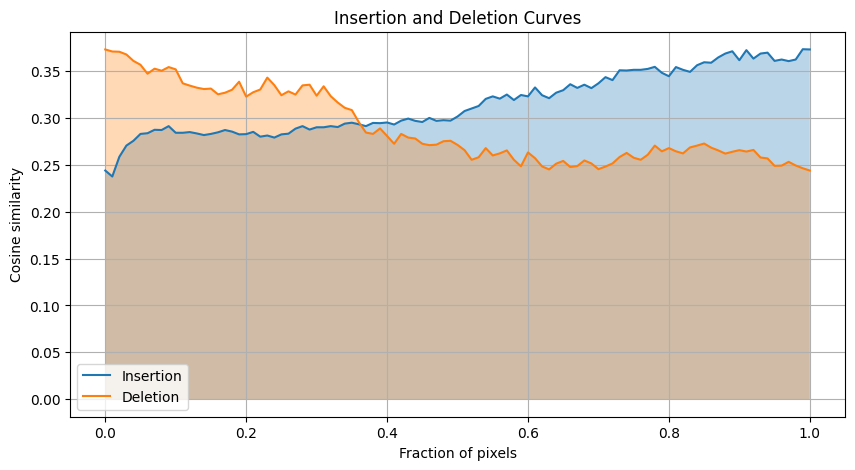

AUC for Insertion: 0.3153
AUC for Deletion: 0.2894
AUC for Insertion: 0.3153, AUC for Deletion: 0.2894

Processing text prompt: atypical pigment network


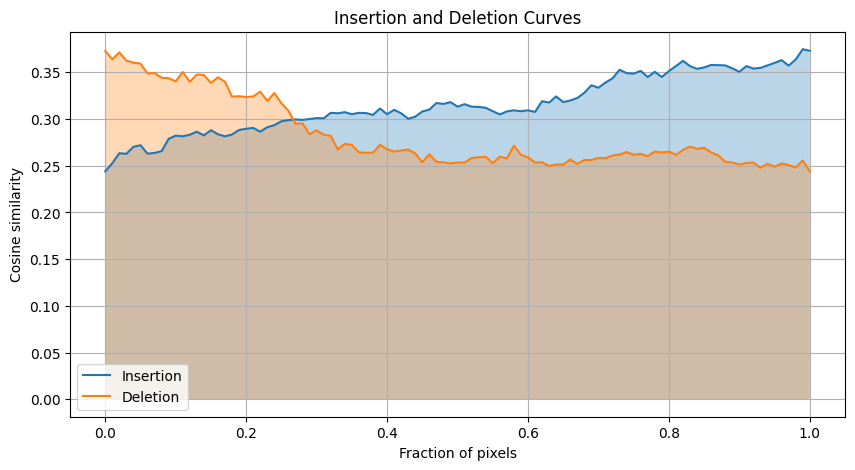

AUC for Insertion: 0.3156
AUC for Deletion: 0.2826
AUC for Insertion: 0.3156, AUC for Deletion: 0.2826

Processing text prompt: irregular streaks


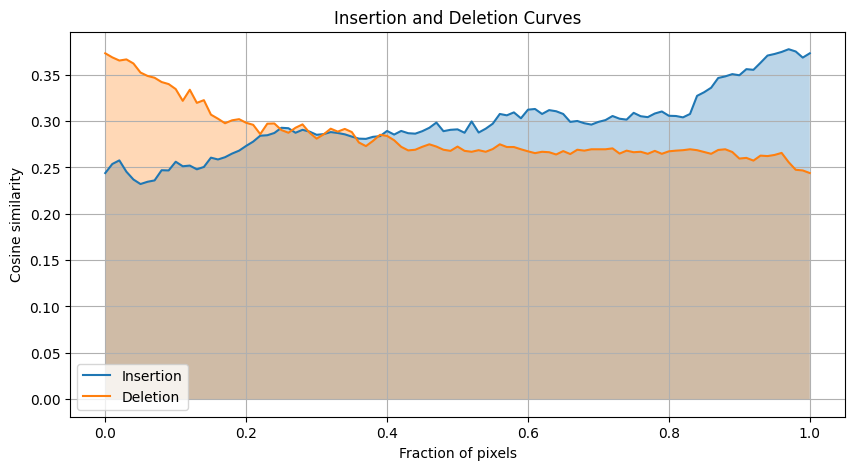

AUC for Insertion: 0.2967
AUC for Deletion: 0.2844
AUC for Insertion: 0.2967, AUC for Deletion: 0.2844

Processing text prompt: white areas regression structures


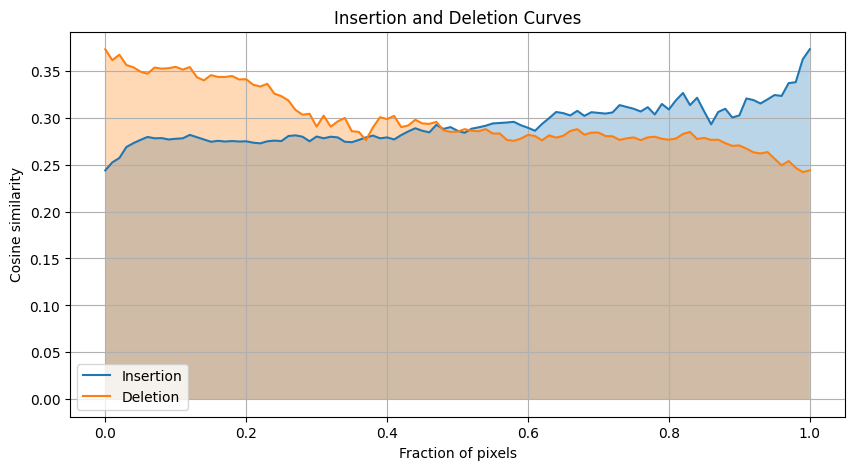

AUC for Insertion: 0.2927
AUC for Deletion: 0.2983
AUC for Insertion: 0.2927, AUC for Deletion: 0.2983

Processing text prompt: irregular dots and globules


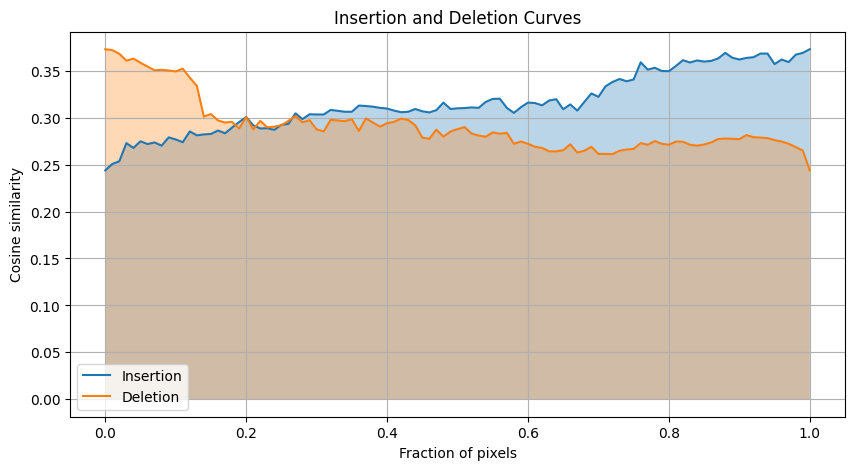

AUC for Insertion: 0.3164
AUC for Deletion: 0.2912
AUC for Insertion: 0.3164, AUC for Deletion: 0.2912

Processing text prompt: present blue whitish veil


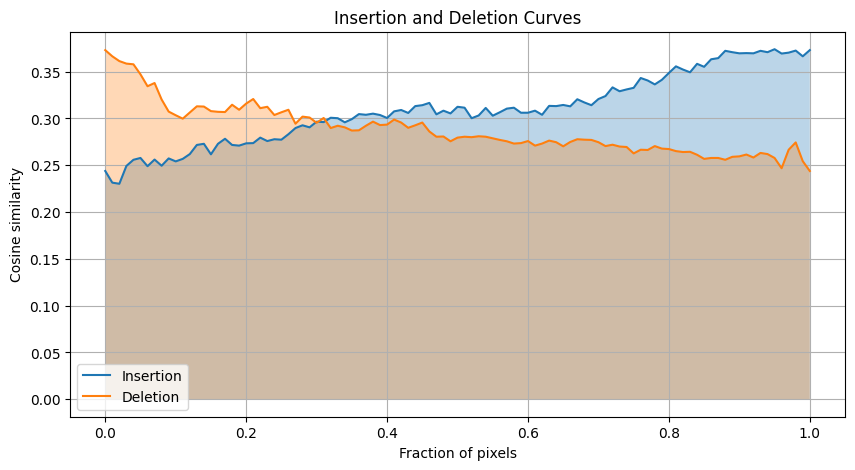

AUC for Insertion: 0.3095
AUC for Deletion: 0.2881
AUC for Insertion: 0.3095, AUC for Deletion: 0.2881

Processing text prompt: missing asymmetry


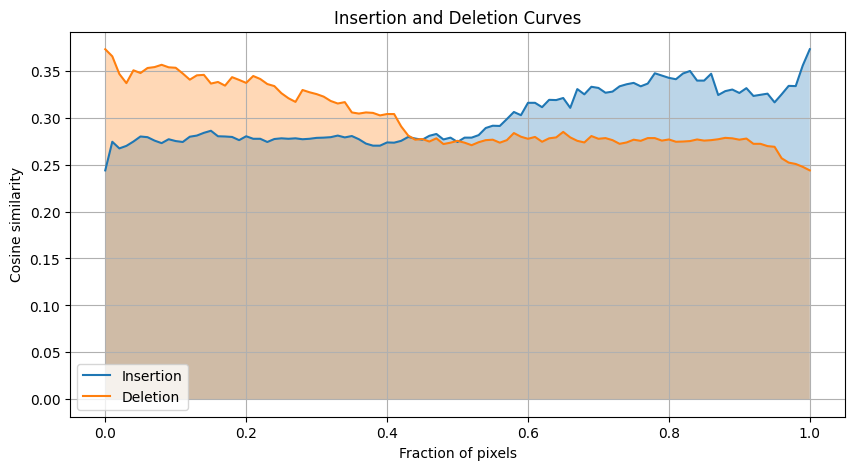

AUC for Insertion: 0.3003
AUC for Deletion: 0.2988
AUC for Insertion: 0.3003, AUC for Deletion: 0.2988

Processing text prompt: missing color


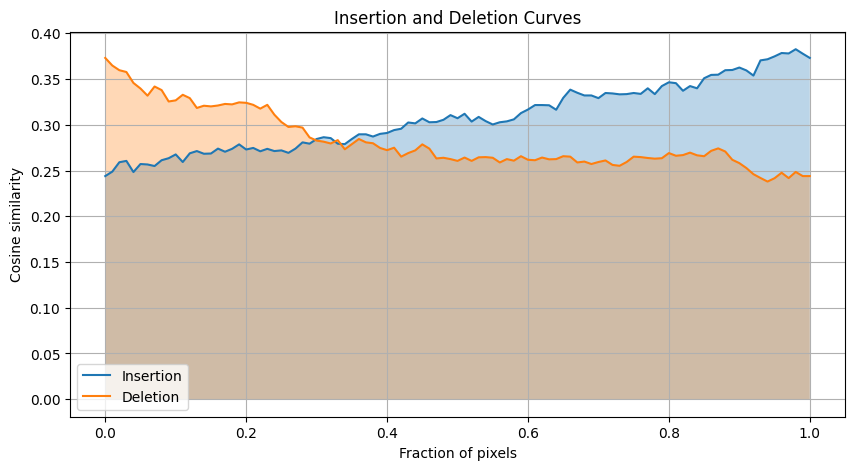

AUC for Insertion: 0.3080
AUC for Deletion: 0.2822
AUC for Insertion: 0.3080, AUC for Deletion: 0.2822

Processing text prompt: within regression vascular structures


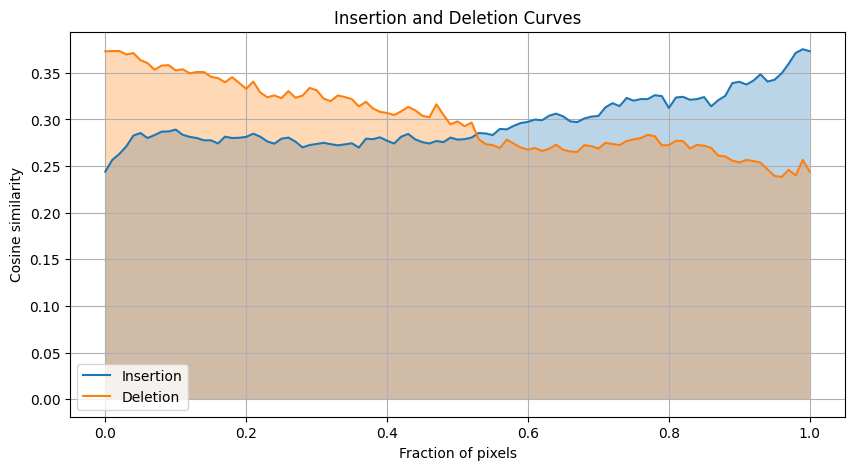

AUC for Insertion: 0.2970
AUC for Deletion: 0.3003
AUC for Insertion: 0.2970, AUC for Deletion: 0.3003

Processing text prompt: diffuse regular pigmentation


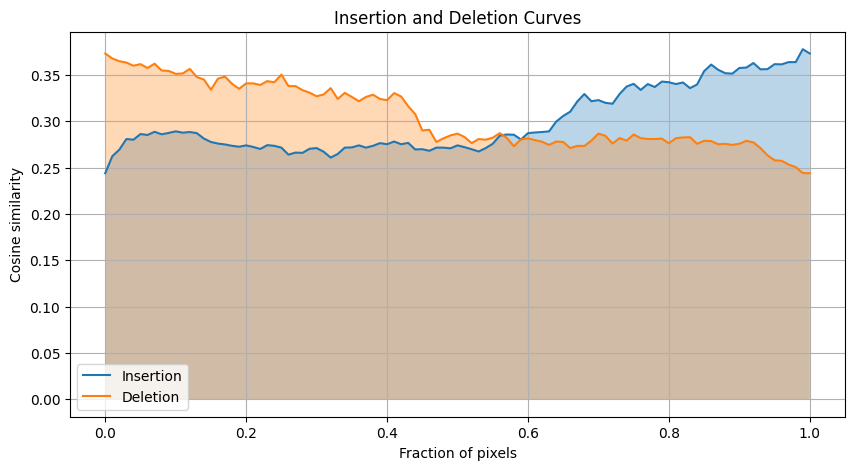

AUC for Insertion: 0.2999
AUC for Deletion: 0.3051
AUC for Insertion: 0.2999, AUC for Deletion: 0.3051


In [ ]:
def insertion_deletion_maps(attention_map, img, text_embedding, steps=100):
    expected_resolution = clipmodel.visual.input_resolution

    resized_map = F.interpolate(attention_map.unsqueeze(0).unsqueeze(0), size=(expected_resolution, expected_resolution), mode='bilinear', align_corners=False).squeeze()

    img_resized = F.interpolate(img.unsqueeze(0), size=(expected_resolution, expected_resolution), mode='bilinear', align_corners=False).squeeze()

    sorted_indices = torch.argsort(resized_map.flatten(), descending=True)
    h, w = resized_map.shape[-2:]

    insertion_scores = []
    deletion_scores = []

    for i in range(steps + 1):
        fraction = i / steps
        num_pixels = int(fraction * h * w)

        insertion_mask = torch.zeros_like(resized_map).flatten()
        insertion_mask[sorted_indices[:num_pixels]] = 1
        insertion_mask = insertion_mask.view(h, w)
        insertion_img = img_resized * insertion_mask
        insertion_score = clipmodel.encode_image(insertion_img.unsqueeze(0))
        insertion_score = F.normalize(insertion_score, dim=-1)
        insertion_scores.append((insertion_score @ text_embedding[0]).item())

        deletion_mask = torch.ones_like(resized_map).flatten()
        deletion_mask[sorted_indices[:num_pixels]] = 0
        deletion_mask = deletion_mask.view(h, w)
        deletion_img = img_resized * deletion_mask
        deletion_score = clipmodel.encode_image(deletion_img.unsqueeze(0))
        deletion_score = F.normalize(deletion_score, dim=-1)
        deletion_scores.append((deletion_score @ text_embedding[0]).item())

    return insertion_scores, deletion_scores

num_text_embeddings = text_embedding.shape[0]

for i in range(min(len(texts), num_text_embeddings)):
    print(f"\nProcessing text prompt: {texts[i]}")

    # Use grad_cam or grad_emap depending on what you want to evaluate
    attention_map = grad_emaps[i].clone()
    attention_map -= attention_map.min()
    attention_map /= attention_map.max()

    insertion_scores, deletion_scores = insertion_deletion_maps(attention_map, img_preprocessed_k.squeeze(0), text_embedding)

    auc_insertion, auc_deletion = plot_insertion_deletion(insertion_scores, deletion_scores)
    print(f"AUC for Insertion: {auc_insertion:.4f}, AUC for Deletion: {auc_deletion:.4f}")


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import auc

def plot_insertion_deletion(insertion_scores, deletion_scores, steps=100):
    fractions = [i / steps for i in range(steps + 1)]

    plt.figure(figsize=(10, 5))

    # Plot insertion curve
    plt.plot(fractions, insertion_scores, label="Insertion")
    plt.fill_between(fractions, insertion_scores, alpha=0.3)

    # Plot deletion curve
    plt.plot(fractions, deletion_scores, label="Deletion")
    plt.fill_between(fractions, deletion_scores, alpha=0.3)

    plt.xlabel("Fraction of pixels")
    plt.ylabel("Cosine similarity")
    plt.title("Insertion and Deletion Curves")
    plt.legend()
    plt.grid(True)
    plt.show()

    # Calculate AUC
    auc_insertion = auc(fractions, insertion_scores)
    auc_deletion = auc(fractions, deletion_scores)

    print(f"AUC for Insertion: {auc_insertion:.4f}")
    print(f"AUC for Deletion: {auc_deletion:.4f}")

    return auc_insertion, auc_deletion


Rollout: used to propagate attention weights through neural network layers to understand how information flows.
Implement: multiplying the attention maps across layers.

In [ ]:
# # rollout
# def rollout(attns):
#     rollout_map = torch.eye(attns[0].shape[-1]).to(attns[0].device)
#     for attn in attns:
#         attn = attn[0] + torch.eye(attn.shape[-1]).to(attn.device)
#         attn = attn / attn.sum(dim=-1, keepdim=True)
#         rollout_map = torch.matmul(rollout_map, attn)
#     return rollout_map[0, 1:].reshape(map_size)


In [ ]:
def rollout_explanation(attns, text_embedding):
    rollout_map = torch.eye(attns[0].shape[-1]).to(attns[0].device)
    for attn in attns:
        attn = attn[0] + torch.eye(attn.shape[-1]).to(attn.device)
        attn = attn / attn.sum(dim=-1, keepdim=True)
        rollout_map = torch.matmul(rollout_map, attn)
    rollout_map = rollout_map[0, 1:].reshape(map_size)

    # Weight the rollout map by cosine similarity with text embeddings
    weighted_rollout = rollout_map * (cosine.unsqueeze(-1).unsqueeze(-1))
    return weighted_rollout.sum(dim=0)


GAME: aggregates attention maps across different layers to generate a global explanation map. It is similar to the rollout approach but focuses on global consistency.

In [ ]:
def game(attns):
    game_map = sum(attn[0, :1, 1:].reshape(map_size) for attn in attns) / len(attns)
    return game_map


In [ ]:
def game_explanation(attns, text_embedding):
    game_map = sum(attn[0, :1, 1:].reshape(map_size) for attn in attns) / len(attns)

    # Weight the GAME map by cosine similarity with text embeddings
    weighted_game_map = game_map * (cosine.unsqueeze(-1).unsqueeze(-1))
    return weighted_game_map.sum(dim=0)


MaskCLIP typically involves masking parts of the image and observing the changes in the output to determine the contribution of different regions.

In [ ]:
def maskclip(ori_img_embedding, text_embedding, outputs, mask_size, map_size):
    masked_similarities = []
    for i in range(map_size[0] // mask_size[0]):
        for j in range(map_size[1] // mask_size[1]):
            mask = torch.ones_like(outputs)
            mask[:, i*mask_size[0]:(i+1)*mask_size[0], j*mask_size[1]:(j+1)*mask_size[1]] = 0
            masked_outputs = outputs * mask
            masked_embedding = F.normalize(masked_outputs[:,0], dim=-1)
            cosine = (masked_embedding @ text_embedding.T)[0]
            masked_similarities.append(cosine)

    # Print size for debugging
    print("masked_similarities length:", len(masked_similarities))
    print("Expected map size:", map_size[0] * map_size[1])

    # Ensure masked_similarities can be reshaped into map_size
    maskclip_map = torch.stack(masked_similarities)
    maskclip_map = maskclip_map.view(-1)  # Flatten first
    expected_size = map_size[0] * map_size[1]

    if maskclip_map.shape[0] < expected_size:
        padding = torch.zeros(expected_size - maskclip_map.shape[0]).to(maskclip_map.device)
        maskclip_map = torch.cat([maskclip_map, padding])
    elif maskclip_map.shape[0] > expected_size:
        maskclip_map = maskclip_map[:expected_size]

    maskclip_map = maskclip_map.reshape(map_size)
    return maskclip_map



CLIPSurgery involves making modifications to the CLIP model itself, such as surgery on the weights or activations to understand their impact. This might require a more in-depth modification of the network and could be implemented similarly to Grad-CAM or Rollout.

In [ ]:
def clipsurgery(feat, map_size, surgery_type='alteration'):
    if surgery_type == 'alteration':
        modified_feat = feat * torch.randn_like(feat)  # Example of modification
    elif surgery_type == 'inversion':
        modified_feat = 1 / feat  # Example of surgery operation

    # Flatten the tensor and then adjust its size
    modified_feat = modified_feat.sum(dim=-1).view(-1)
    expected_size = map_size[0] * map_size[1]

    if modified_feat.shape[0] < expected_size:
        # Padding to match expected size
        padding = torch.zeros(expected_size - modified_feat.shape[0]).to(modified_feat.device)
        modified_feat = torch.cat([modified_feat, padding])
    elif modified_feat.shape[0] > expected_size:
        # Truncate to match expected size
        modified_feat = modified_feat[:expected_size]

    # Normalize for better visualization
    modified_feat -= modified_feat.min()
    modified_feat /= modified_feat.max()

    return modified_feat.reshape(map_size)


RISE is a perturbation-based method that involves creating random masks and observing how the model's output changes.

In [ ]:
def rise(outputs, text_embedding, map_size, n_masks=1000):
    # Generate random binary masks with the same spatial dimensions as map_size
    masks = torch.randint(0, 2, (n_masks, map_size[0], map_size[1])).float().to(outputs.device)

    # Flatten the masks and outputs to match their dimensions
    masks_flat = masks.view(n_masks, -1)  # Reshape to (n_masks, H * W)
    outputs_flat = outputs.view(outputs.shape[0], -1)  # Flatten H and W in outputs (batch_size, channels, H*W)

    masked_similarities = []
    for mask in masks_flat:
        mask_expanded = mask.unsqueeze(0).expand(outputs_flat.size())  # Expand mask to match the flattened outputs
        masked_outputs = outputs_flat * mask_expanded  # Element-wise multiplication

        # Calculate mean along the spatial dimension and then cosine similarity
        masked_embedding = F.normalize(masked_outputs.mean(dim=-1), dim=-1)
        cosine = (masked_embedding @ text_embedding.T)[0]
        masked_similarities.append(cosine)

    # Compute the average of masked similarities
    rise_map = torch.stack(masked_similarities).mean(dim=0).reshape(map_size)

    # Normalize the rise map
    rise_map -= rise_map.min()
    rise_map /= rise_map.max()

    return rise_map


masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728


<ipython-input-5-2534cff73a29>:18: RuntimeWarning: invalid value encountered in cast
  color = cv2.applyColorMap((map*255).astype(np.uint8), cv2.COLORMAP_JET) # cv2 to plt


masked_similarities length: 6
Expected map size: 1728
masked_similarities length: 6
Expected map size: 1728


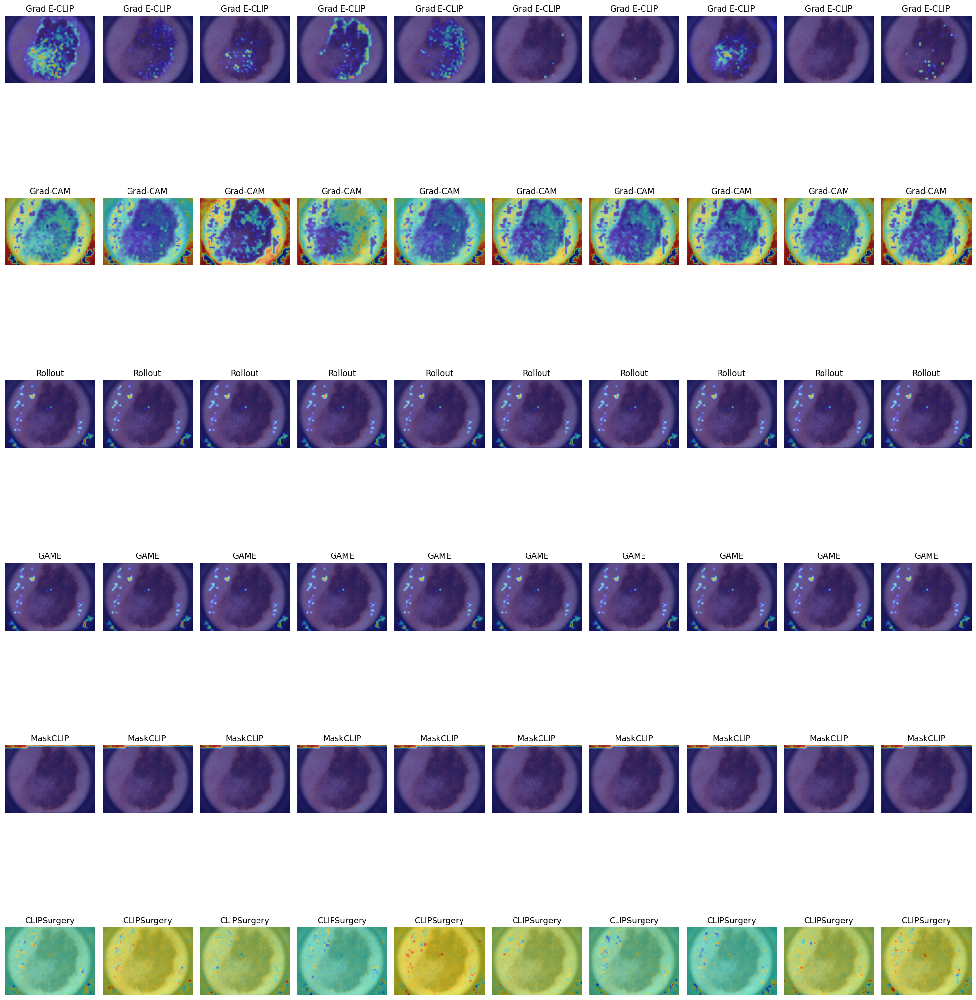

In [ ]:
fig, axs = plt.subplots(ncols=len(cosine), nrows=6, figsize=(20, 24))  # Adjust nrows according to the number of methods

# Reduce spacing between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.1)

for i, c in enumerate(cosine):
    # Grad E-CLIP
    grad_emap = grad_emaps[i].clone()
    grad_emap -= grad_emap.min()
    grad_emap /= grad_emap.max()
    c_ret = visualize(grad_emap.detach().cpu(), img, resize)
    axs[0, i].axis('off')
    axs[0, i].imshow(c_ret)
    axs[0, i].set_title("Grad E-CLIP")

    # Grad-CAM
    grad_cam_map = grad_cams[i].clone()
    grad_cam_map -= grad_cam_map.min()
    grad_cam_map /= grad_cam_map.max()
    c_ret = visualize(grad_cam_map.detach().cpu(), img, resize)
    axs[1, i].axis('off')
    axs[1, i].imshow(c_ret)
    axs[1, i].set_title("Grad-CAM")

    # # Rollout
    # rollout_map = rollout(attns)
    # rollout_map -= rollout_map.min()  # Normalize Rollout map for better visualization
    # rollout_map /= rollout_map.max()
    # c_ret = visualize(rollout_map.detach().cpu(), img, resize)
    # axs[2, i].axis('off')
    # axs[2, i].imshow(c_ret)
    # axs[2, i].set_title("Rollout")
    # Rollout Explanation
    rollout_map = rollout_explanation(attns, text_embedding)
    rollout_map -= rollout_map.min()
    rollout_map /= rollout_map.max()
    c_ret = visualize(rollout_map.detach().cpu(), img, resize)
    axs[2, i].axis('off')
    axs[2, i].imshow(c_ret)
    axs[2, i].set_title("Rollout")

    # # GAME
    # game_map = game(attns)
    # game_map -= game_map.min()  # Normalize GAME map for better visualization
    # game_map /= game_map.max()
    # c_ret = visualize(game_map.detach().cpu(), img, resize)
    # axs[3, i].axis('off')
    # axs[3, i].imshow(c_ret)
    # axs[3, i].set_title("GAME")
        # GAME Explanation
    game_map = game_explanation(attns, text_embedding)
    game_map -= game_map.min()
    game_map /= game_map.max()
    c_ret = visualize(game_map.detach().cpu(), img, resize)
    axs[3, i].axis('off')
    axs[3, i].imshow(c_ret)
    axs[3, i].set_title("GAME")

    # MaskCLIP
    maskclip_map = maskclip(ori_img_embedding, text_embedding, outputs, [16, 16], map_size)
    maskclip_map -= maskclip_map.min()  # Normalize MaskCLIP map for better visualization
    maskclip_map /= maskclip_map.max()
    c_ret = visualize(maskclip_map.detach().cpu(), img, resize)
    axs[4, i].axis('off')
    axs[4, i].imshow(c_ret)
    axs[4, i].set_title("MaskCLIP")

    # CLIPSurgery
    clipsurgery_map = clipsurgery(last_feat, map_size)
    clipsurgery_map -= clipsurgery_map.min()  # Normalize CLIPSurgery map for better visualization
    clipsurgery_map /= clipsurgery_map.max()
    c_ret = visualize(clipsurgery_map.detach().cpu(), img, resize)
    axs[5, i].axis('off')
    axs[5, i].imshow(c_ret)
    axs[5, i].set_title("CLIPSurgery")

    # # RISE
    # rise_map = rise(outputs, text_embedding, map_size)
    # rise_map -= rise_map.min()  # Normalize RISE map for better visualization
    # rise_map /= rise_map.max()
    # c_ret = visualize(rise_map.detach().cpu(), img, resize)
    # axs[6, i].axis('off')
    # axs[6, i].imshow(c_ret)
    # axs[6, i].set_title("RISE")

fig.tight_layout()
plt.show()
